In [63]:
# conda activate xen

In [37]:
library(Seurat)
library(future)
library(ggplot2)
library(SeuratDisk)
library(here)
library(tidyverse)
library(dplyr)

mouse_panel = read.csv('/projects/pfenninggroup/spatial/resources/panels/original_mouse_brain_markers.csv')

save = TRUE

# for dorsal horn celltypes
colors_macaque = c('#0075DC','#993F00','#4C005C','#191919','#005C31','#2BCE48','#FFCC99','#808080','#94FFB5','#8F7C00','#9DCC00',
         '#C20088','#003380','#FFA405','#5EF1F2','#FFA8BB','#426600','#FF0010')
ordered_dh_names = c('Exc-BNC2','Exc-NMUR2', 'Exc-NMU', 'Exc-TAC3','Exc-LMO3', 'Exc-SKOR2', 'Exc-MAF', 'Exc-MAFA', 
                  'Exc-NTS', 'Exc-SNTB1', 'Exc-PBX3', 'Inh-CACNA2D3', 'Inh-SORCS1','Inh-PDZD2', 'Inh-NPY', 'Inh-MEF2C','Inh-NXPH1','Inh-PDYN')


# Load original xenium data and mouse RNA data

In [2]:
main_path = '/projects/pfenninggroup/spatial/seal/mouse_spinal_cord_xenium_first_run/'
saline_data = paste0(main_path, 'output-XETG00176__0010684__SALINE__20231107__233200')
xenium.obj <- LoadXenium(saline_data, fov = "fov")
xenium.obj <- subset(xenium.obj, subset = nCount_Xenium > 0)

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warn

In [3]:
## run below to label the project

top_annotation <- readRDS("/projects/pfenninggroup/spatial/seal/mouse_spinal_cord_xenium_first_run/rdas/first_run_saline_top_annotation.rds")
subtype_annotation <- readRDS("/projects/pfenninggroup/spatial/seal/mouse_spinal_cord_xenium_first_run/rdas/first_run_saline_subtype_annotation.rds")

xenium.obj$top_annotation = top_annotation
xenium.obj$subtype_annotation = subtype_annotation

In [4]:
filename = "/projects/pfenninggroup/singleCell/Macaque_SealDorsalHorn_snATAC-seq/data/tidy_data/rdas/mouse_rna_dh_conserved_names.h5seurat"
mouse_dh_conserved_names = LoadH5Seurat(filename)
mouse_dh_conserved_names$conserved_marker_nicknames = factor(mouse_dh_conserved_names$conserved_marker_nicknames, levels = ordered_dh_names)

Validating h5Seurat file

Initializing MAGIC_RNA with data

Adding miscellaneous information for MAGIC_RNA

Initializing MAGIC_SCT with data

Adding miscellaneous information for MAGIC_SCT

Initializing RNA with data

Adding counts for RNA

Adding miscellaneous information for RNA

Initializing SCT with data

Adding counts for SCT

Adding scale.data for SCT

Adding variable feature information for SCT

Adding miscellaneous information for SCT

Initializing alra with data

Adding scale.data for alra

Adding miscellaneous information for alra

Initializing integrated with data

Adding scale.data for integrated

Adding variable feature information for integrated

Adding miscellaneous information for integrated

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

In [46]:
mouse_panel$Genes

[1] "2010300C02Rik" "Acsbg1"        "Acta2"         "Acvrl1"       
  [5] "Adamts2"       "Adamtsl1"      "Adgrl4"        "Aldh1a2"      
  [9] "Angpt1"        "Ano1"          "Aqp4"          "Arc"          
 [13] "Arhgap12"      "Arhgap25"      "Arhgap6"       "Arhgef28"     
 [17] "Bcl11b"        "Bdnf"          "Bhlhe22"       "Bhlhe40"      
 [21] "Btbd11"        "Cabp7"         "Cacna2d2"      "Calb1"        
 [25] "Calb2"         "Car4"          "Carmn"         "Cbln1"        
 [29] "Cbln4"         "Ccn2"          "Cd24a"         "Cd300c2"      
 [33] "Cd44"          "Cd53"          "Cd68"          "Cd93"         
 [37] "Cdh13"         "Cdh20"         "Cdh4"          "Cdh6"         
 [41] "Cdh9"          "Chat"          "Chodl"         "Chrm2"        
 [45] "Cldn5"         "Clmn"          "Cntn6"         "Cntnap4"      
 [49] "Cntnap5b"      "Cobll1"        "Col19a1"       "Col1a1"       
 [53] "Col6a1"        "Cort"          "Cplx3"         "Cpne4"        
 [57] "Cpne6"         "Cpne8"         "Crh"           "Cspg4"        
 [61] "Cux2"          "Cwh43"         "Cyp1b1"        "Dcn"          
 [65] "Deptor"        "Dkk3"          "Dner"          "Dpy19l1"      
 [69] "Dpyd"          "Ebf3"          "Emcn"          "Epha4"        
 [73] "Eya4"          "Fezf2"         "Fgd5"          "Fhod3"        
 [77] "Fibcd1"        "Fign"          "Fmod"          "Fn1"          
 [81] "Fos"           "Foxp2"         "Gad1"          "Gad2"         
 [85] "Gadd45a"       "Galnt14"       "Garnl3"        "Gfap"         
 [89] "Gfra2"         "Gjb2"          "Gjc3"          "Gli3"         
 [93] "Gm19410"       "Gm2115"        "Gng12"         "Gpr17"        
 [97] "Grik3"         "Gsg1l"         "Gucy1a1"       "Hapln1"       
[101] "Hat1"          "Hpcal1"        "Hs3st2"        "Htr1f"        
[105] "Id2"           "Igf1"          "Igf2"          "Igfbp4"       
[109] "Igfbp5"        "Igfbp6"        "Igsf21"        "Ikzf1"        
[113] "Inpp4b"        "Kcnh5"         "Kcnmb2"        "Kctd12"       
[117] "Kctd8"         "Kdr"           "Lamp5"         "Laptm5"       
[121] "Ly6a"          "Lypd6"         "Mapk4"         "Mdga1"        
[125] "Mecom"         "Meis2"         "Myl4"          "Myo16"        
[129] "Ndst3"         "Ndst4"         "Necab1"        "Necab2"       
[133] "Nell1"         "Neto2"         "Neurod6"       "Nostrin"      
[137] "Npnt"          "Npy2r"         "Nr2f2"         "Nrep"         
[141] "Nrn1"          "Nrp2"          "Nts"           "Ntsr2"        
[145] "Nwd2"          "Nxph3"         "Opalin"        "Opn3"         
[149] "Orai2"         "Paqr5"         "Parm1"         "Pcsk5"        
[153] "Pde11a"        "Pde7b"         "Pdgfra"        "Pdyn"         
[157] "Pdzd2"         "Pdzrn3"        "Pecam1"        "Penk"         
[161] "Pglyrp1"       "Pip5k1b"       "Pkib"          "Plch1"        
[165] "Plcxd2"        "Plcxd3"        "Plekha2"       "Pln"          
[169] "Pou3f1"        "Ppp1r1b"       "Prdm8"         "Prox1"        
[173] "Prph"          "Prr16"         "Prss35"        "Pthlh"        
[177] "Pvalb"         "Rab3b"         "Rasgrf2"       "Rasl10a"      
[181] "Rbp4"          "Rfx4"          "Rims3"         "Rmst"         
[185] "Rnf152"        "Ror1"          "Rorb"          "Rprm"         
[189] "Rspo1"         "Rspo2"         "Rxfp1"         "Satb2"        
[193] "Sdk2"          "Sema3a"        "Sema3d"        "Sema3e"       
[197] "Sema5b"        "Sema6a"        "Shisa6"        "Siglech"      
[201] "Sipa1l3"       "Sla"           "Slc13a4"       "Slc17a6"      
[205] "Slc17a7"       "Slc39a12"      "Slc44a5"       "Slc6a3"       
[209] "Slfn5"         "Slit2"         "Sncg"          "Sntb1"        
[213] "Sorcs3"        "Sox10"         "Sox11"         "Sox17"        
[217] "Spag16"        "Spi1"          "Spp1"          "Sst"          
[221] "Stard5"        "Strip2"        "Syndig1"       "Syt17"        
[225] "Syt2"          "Syt6"          "Tacr1"         "Tanc1"        
[229] "Th"  

In [58]:
# limit variable genes to those in Xenium
VariableFeatures(mouse_dh_conserved_names) <- mouse_panel$Genes

# First run clustering with SCT
DefaultAssay(mouse_dh_conserved_names) <- 'SCT'
mouse_dh_conserved_names <- ScaleData(mouse_dh_conserved_names, verbose = FALSE)
mouse_dh_conserved_names <- RunPCA(mouse_dh_conserved_names, npcs = 30, features = mouse_panel$Genes)
mouse_dh_conserved_names <- RunUMAP(mouse_dh_conserved_names, dims = 1:30)
# mouse_neurons <- FindNeighbors(mouse_neurons, reduction = "pca", dims = 1:30)
# mouse_neurons <- FindClusters(mouse_neurons, resolution = 0.3)

Warning message:
“Not all features provided are in this Assay object, removing the following feature(s): Carmn, Ccn2, Cd300c2, Gm19410, Gucy1a1, Trbc2”
Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 6 features requested have not been scaled (running reduction without them): Carmn, Ccn2, Cd300c2, Gm19410, Gucy1a1, Trbc2”
Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 3 features requested have zero variance (running reduction without them): Fezf2, Slc17a7, Sox17”
PC_ 1 
Positive:  Pdzd2, Cntnap4, Thsd7a, Syt2, Gad2, Rorb, Kcnmb2, Grik3, Col19a1, Gad1 
	   Myo16, Htr1f, Strip2, Lamp5, Sema3e, Fhod3, Unc13c, Cdh4, Nr2f2, Sema5b 
	   Igsf21, Cacna2d2, Tanc1, Zfpm2, Galnt14, Cntn6, Hs3st2, Pde7b, Sorcs3, Cux2 
Negative:  Pde11a, Arhgap6, Rmst, Cpne8, Vat1l, Ebf3, Dpyd, Inpp4b, Tmem163, Mapk4 
	   Calb1, Sst, Pip5k1b, Necab1, Rasgrf2, Pcsk5, Sntb1, Cntnap5b, Nrep, Slc17a6 
	   Vwc2l, Shisa6

png 
  2

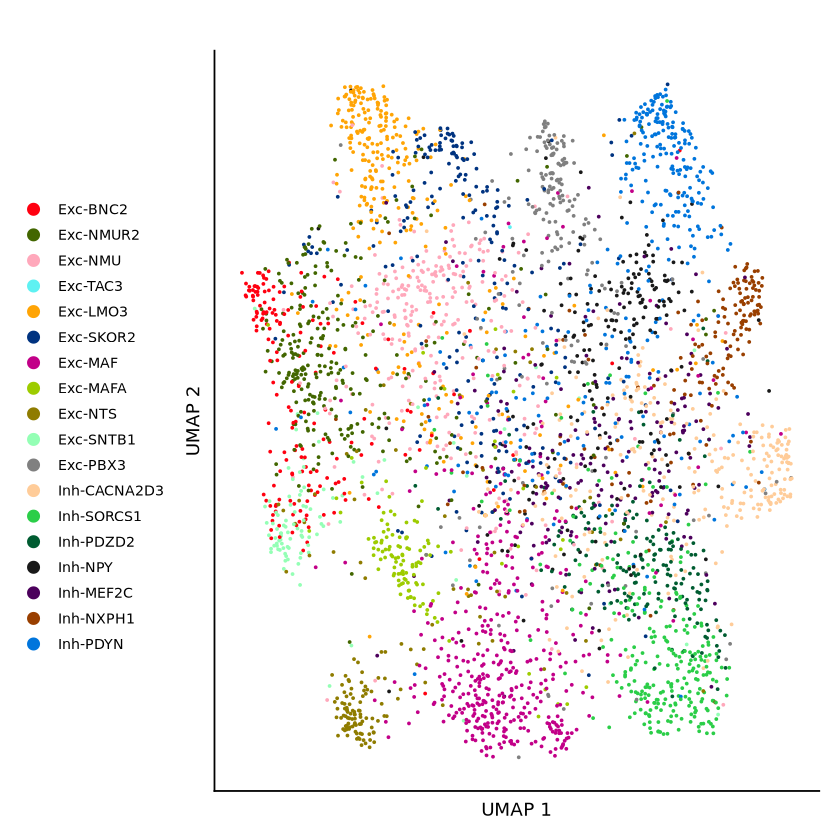

In [70]:
# before imputation
DefaultAssay(mouse_dh_conserved_names) <- 'SCT'
p <- DimPlot(mouse_dh_conserved_names, group.by = 'conserved_marker_nicknames', cols = rev(colors_macaque) ) + 

            theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_text(size = 11),
            axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 11),
            plot.title = element_text(size = 11), legend.text=element_text(size=8.5), axis.text=element_text(size=10),
            legend.position = "left") +
            labs(title="", x ="UMAP 1", y ='UMAP 2')

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","justRNA_neurons_noImputation_",Sys.Date(),".pdf")), width = 4.5, height = 4)
print(p)
dev.off()

print(p)

In [71]:
DefaultAssay(mouse_dh_conserved_names) <- 'alra'
#mouse_dh_conserved_names <- ScaleData(mouse_dh_conserved_names, verbose = FALSE)
mouse_dh_conserved_names <- RunPCA(mouse_dh_conserved_names, npcs = 30, features = mouse_panel$Genes)
mouse_dh_conserved_names <- RunUMAP(mouse_dh_conserved_names, dims = 1:30)

Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 6 features requested have not been scaled (running reduction without them): Carmn, Ccn2, Cd300c2, Gm19410, Gucy1a1, Trbc2”
Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1 features requested have zero variance (running reduction without them): Sox17”
PC_ 1 
Positive:  Garnl3, Cacna2d2, Sipa1l3, Htr1f, Rnf152, Pde7b, Orai2, Hat1, Cntn6, Clmn 
	   Stard5, Pln, Fhod3, Myo16, Dkk3, Gad2, 2010300C02Rik, Ndst4, Pkib, Col19a1 
	   Plcxd3, Strip2, Arhgap12, Thsd7a, Slit2, Sema6a, Cdh6, Cntnap4, Gng12, Epha4 
Negative:  Aqp4, Cpne8, Pde11a, Nts, Slc39a12, Mapk4, Gfap, Tmem163, Calb1, Necab2 
	   Nrep, Sst, Arhgap6, Laptm5, Th, Cbln1, Sla, Sntb1, Igfbp5, Nrn1 
	   Nell1, Opalin, Sema5b, Prph, Tmem132d, Pthlh, Rprm, Igfbp4, Rmst, Ror1 
PC_ 2 
Positive:  Syt2, Pdzd2, Strip2, Cux2, Cntnap4, Stard5, Nr2f2, Col19a1, Clmn, Htr1f 
	   Thsd7a, Gad2, Fhod3

png 
  2

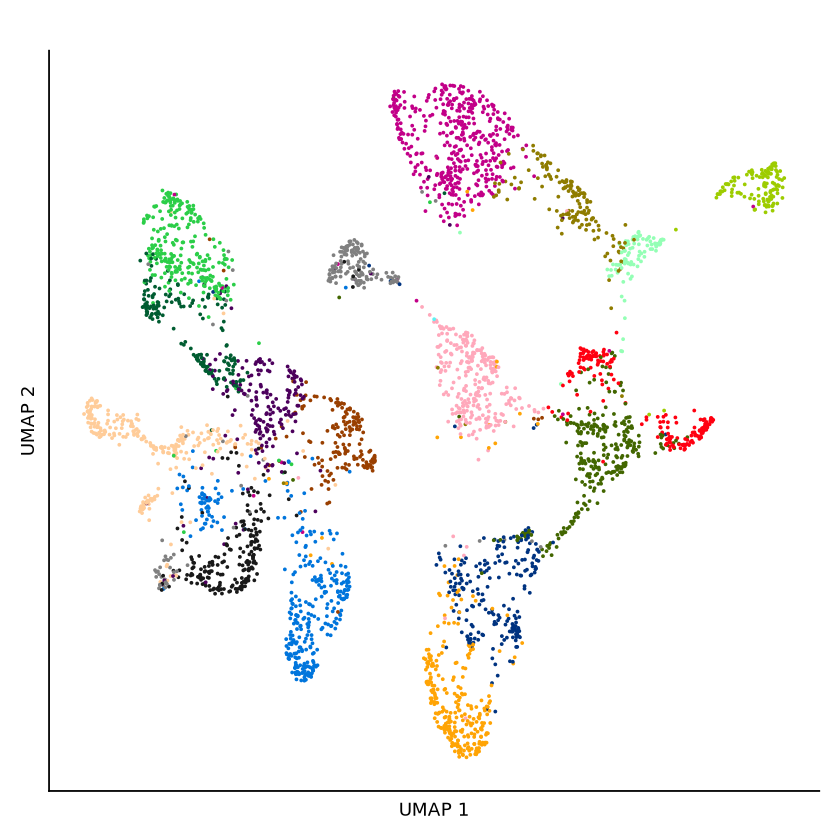

In [72]:
DefaultAssay(mouse_dh_conserved_names) <- 'alra'
p2 <- DimPlot(mouse_dh_conserved_names, group.by = 'conserved_marker_nicknames', cols = rev(colors_macaque)) + 

            theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_text(size = 11),
            axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 11),
            plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
            legend.position = "none") +
            labs(title="", x ="UMAP 1", y ='UMAP 2')

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","justRNA_neurons_withImputation_",Sys.Date(),".pdf")), width = 3.5, height = 4)
print(p2)
dev.off()

print(p2)

In [8]:
# load Russ et all full
filename = "/home/vijaykic/BaDoi/data/tidy_data/rdas/final_cluster_assignment.h5seurat"
mouse_rna = LoadH5Seurat(filename)
mouse_rna = mouse_rna[, mouse_rna$dataset == 'Sathyamurthy']
mouse_rna <- subset(x = mouse_rna, features = unique(mouse_panel$Genes) )
mouse_rna = mouse_rna[,mouse_rna$nCount_RNA > 0 ]

Validating h5Seurat file

Initializing RNA with data

Adding counts for RNA

Adding miscellaneous information for RNA

Initializing integrated with data

Adding scale.data for integrated

Adding variable feature information for integrated

Adding miscellaneous information for integrated

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for umap

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results

Adding data that was not associated with an assay

Warning message:
“Adding a command log without an assay associated with it”
Warning message:
“Adding a command log without an assay associated with it”
Warning message:
“Adding a command log without an assay associated with it”


In [9]:
mouse_rna <- SCTransform(mouse_rna)
mouse_rna <- RunPCA(mouse_rna, npcs = 30, features = rownames(mouse_rna))
mouse_rna <- RunUMAP(mouse_rna, dims = 1:30)

Running SCTransform on assay: RNA

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 238 by 19547

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 230 genes, 5000 cells

Found 4 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 238 genes

Computing corrected count matrix for 238 genes

Calculating gene attributes

Wall clock passed: Time difference of 4.231022 secs

Determine variable features

Centering data matrix

Place corrected count matrix in counts slot

Set default assay to SCT

PC_ 1 
Positive:  Cdh20, Cntnap5b, Rmst, Unc13c, Thsd7a, Cdh13, Prr16, Rorb, Zfp536, Sorcs3 
	   Cntn6, Chrm2, Kctd8, Pde11a, Garnl3, Ebf3, Vat1l, Syndig1, Ndst3, Zfpm2 
	   Myo16, Plcxd3, Meis2, Dpyd, Kcnmb2, Slit2, Mapk4, Btbd11, Tox, Slc39a12

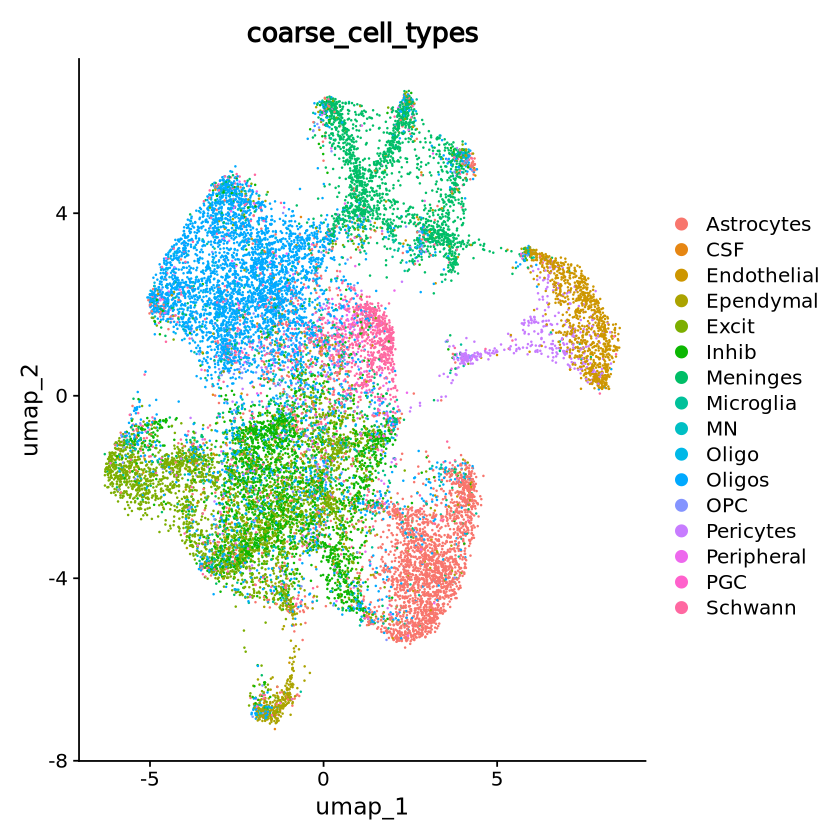

In [10]:
DimPlot(mouse_rna, group.by = 'coarse_cell_types')

In [11]:
xenium.obj <- SCTransform(xenium.obj, assay = "Xenium")
xenium.obj <- RunPCA(xenium.obj, npcs = 30, features = rownames(xenium.obj))
xenium.obj <- RunUMAP(xenium.obj, dims = 1:30)
xenium.obj <- FindNeighbors(xenium.obj, reduction = "pca", dims = 1:30)
xenium.obj <- FindClusters(xenium.obj, resolution = 0.3)

Running SCTransform on assay: Xenium

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 247 by 49620

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 247 genes, 5000 cells

Found 2 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 247 genes

Computing corrected count matrix for 247 genes

Calculating gene attributes

Wall clock passed: Time difference of 5.439413 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 10) for counts dataset

Getting residuals for block 2(of 10) for counts dataset

Getting residuals for block 3(of 10) for counts dataset

Getting residuals for block 4(of 10) for counts dataset

Getting residuals for block 5(of 10) for counts dataset

Getting residuals for block 6(of 10) for counts da

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 49620
Number of edges: 1799801

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9428
Number of communities: 14
Elapsed time: 13 seconds


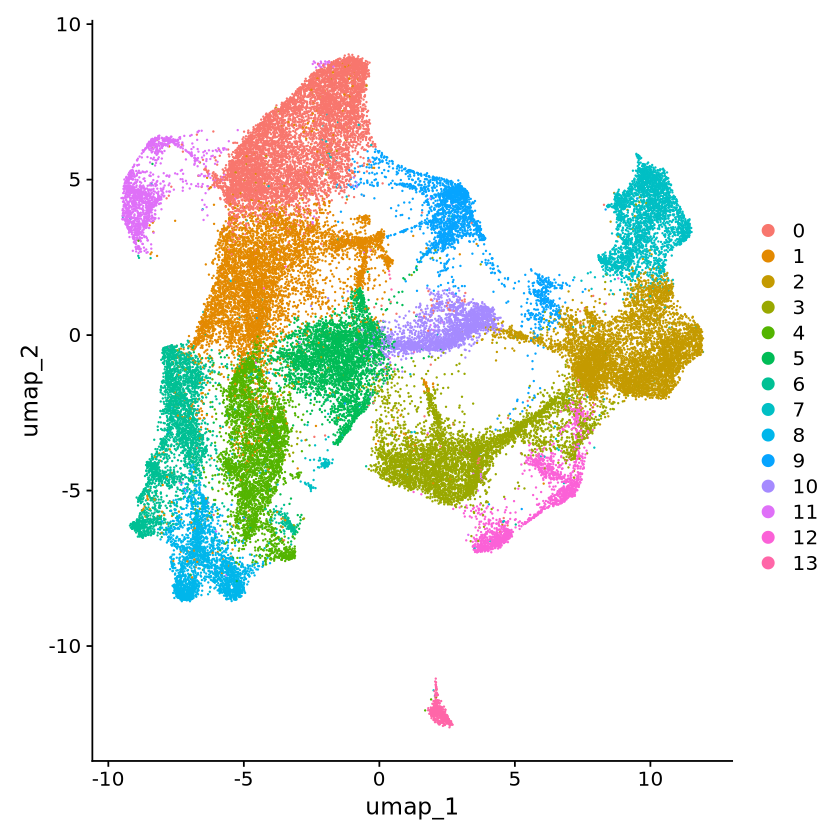

In [12]:
DimPlot(xenium.obj)

# Integrate full Russ et al with full Xenium

In [13]:
features <- SelectIntegrationFeatures(  object.list = list(xenium.obj, mouse_rna)  )
space_rna.anchors <- FindIntegrationAnchors(object.list = list(xenium.obj, mouse_rna), anchor.features = features, k.filter = NA)
space_rna.combined <- IntegrateData(anchorset = space_rna.anchors, normalization.method = "SCT")

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Warning message:
“Adding image data that isn't associated with any assays”
Finding neighborhoods

Finding anchors

	Found 50515 anchors



[1] 1


Warning message:
“Different cells and/or features from existing assay SCT”


[1] 2


Merging dataset 2 into 1

Warning message:
“Adding image data that isn't associated with any assays”
Extracting anchors for merged samples

Warning message:
“Adding image data that isn't associated with any assays”
Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“Different cells and/or features from existing assay integrated”
Warning message:
“Assay integrated changing from Assay to SCTAssay”
Warning message:
“Different cells and/or features from existing assay SCT”


In [14]:
# rename xenium clusters so they aren't overwritten when new clusters are found
space_rna.combined$orig_xenium_clusters <- space_rna.combined$seurat_clusters

# add species column
space_rna.combined$species = ifelse(!is.na(space_rna.combined$coarse_cell_types), "russ", "xenium")
space_rna.combined$integrated_celltype = ifelse(!is.na(space_rna.combined$coarse_cell_types), 
                                                space_rna.combined$coarse_cell_types, space_rna.combined$orig_xenium_clusters)

# Run the standard workflow for visualization and clustering
space_rna.combined <- ScaleData(space_rna.combined, verbose = FALSE)
space_rna.combined <- RunPCA(space_rna.combined, npcs = 30, verbose = FALSE)
space_rna.combined <- RunUMAP(space_rna.combined, reduction = "pca", dims = 1:30, return.model = TRUE)
space_rna.combined <- FindNeighbors(space_rna.combined, reduction = "pca", dims = 1:30)
space_rna.combined <- FindClusters(space_rna.combined, resolution = 0.5)

UMAP will return its model

17:08:22 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:08:22 Read 69167 rows and found 30 numeric columns

17:08:22 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:08:22 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:08:31 Writing NN index file to temp file /tmp/RtmpGYHIhW/file215434b413704

17:08:31 Searching Annoy index using 1 thread, search_k = 3000

17:09:00 Annoy recall = 100%

17:09:01 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:09:04 Initializing

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 69167
Number of edges: 3040366

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9190
Number of communities: 20
Elapsed time: 26 seconds


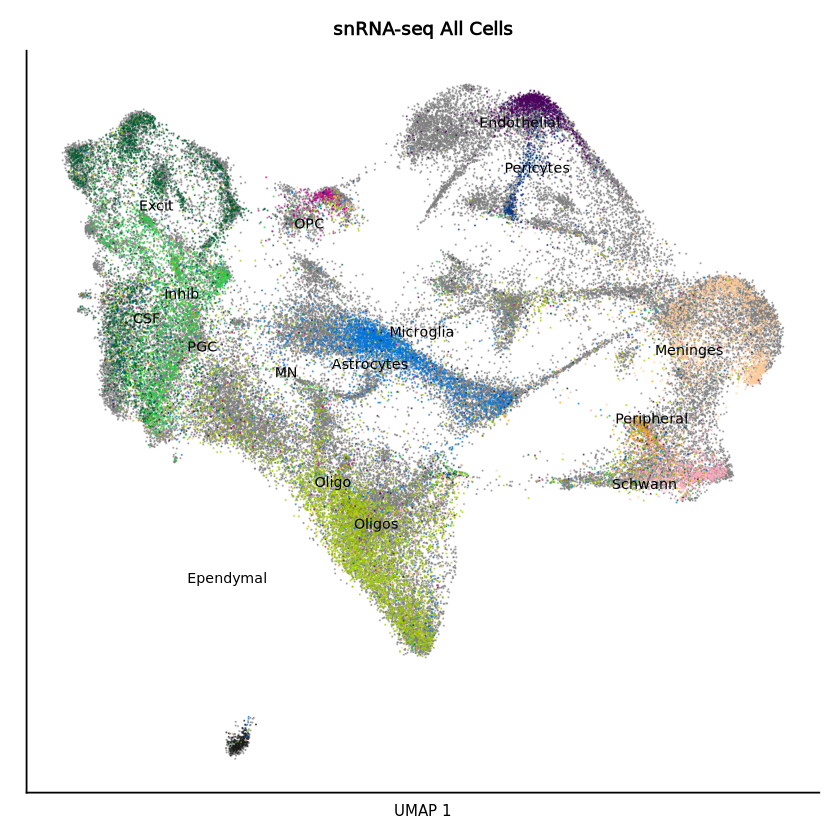

png 
  2

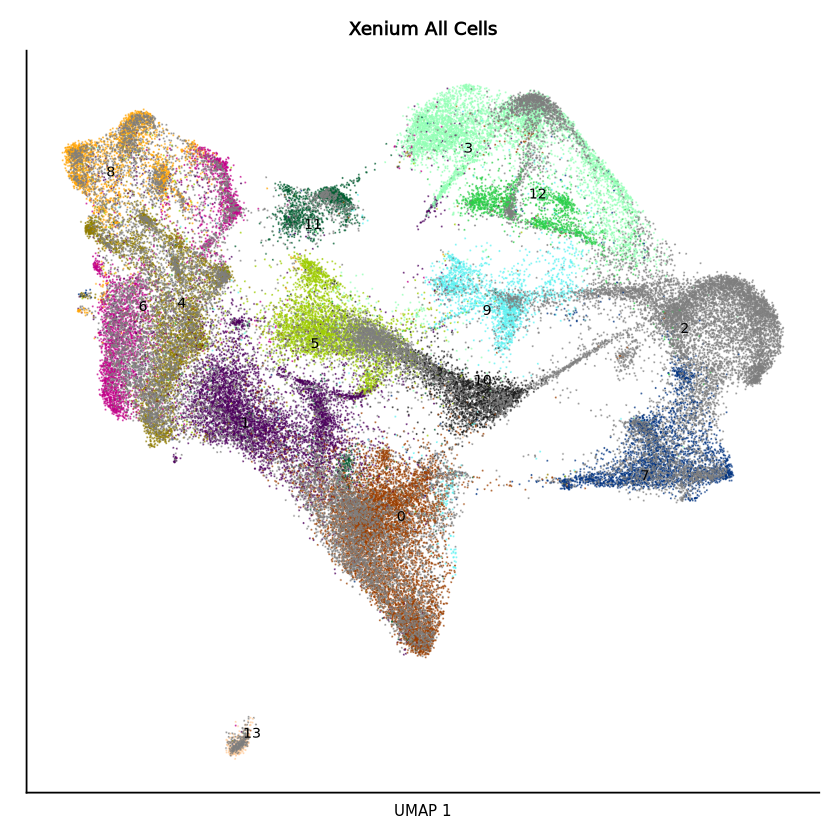

In [15]:
# visualize clusters
save = TRUE

colors_macaque = c('#0075DC','#993F00','#4C005C','#191919','#005C31','#2BCE48','#FFCC99','#808080','#94FFB5','#8F7C00','#9DCC00',
         '#C20088','#003380','#FFA405','#5EF1F2','#FFA8BB','#426600','#FF0010')

# p <- DimPlot(space_rna.combined, reduction = "umap", cols = colors_macaque,
#              group.by = "coarse_cell_types", label = TRUE,label.size = 7, repel = TRUE)
# print(p)

# p2 <- DimPlot(space_rna.combined, reduction = "umap", cols = colors_macaque[1:length(unique(space_rna.combined$orig_xenium_clusters)) + 1],
#               group.by = "orig_xenium_clusters", label = TRUE, 
#               label.size = 7, repel = TRUE)
# print(p2)

p <- DimPlot(space_rna.combined, reduction = "umap", cols = colors_macaque, pt.size = 0.00001, alpha = 0.5,
          group.by = "coarse_cell_types", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="snRNA-seq All Cells", x ="UMAP 1")
print(p)
#p =LabelClusters(p, id = "conserved_marker_nicknames",  fontface = "bold", force = 5, max_time = 5)

p2 <- DimPlot(space_rna.combined, reduction = "umap", pt.size = 0.00001, alpha = 0.5, cols = colors_macaque[1:length(unique(space_rna.combined$orig_xenium_clusters)) + 1],
          group.by = "orig_xenium_clusters", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="Xenium All Cells", x ="UMAP 1")
print(p2)

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_all_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p)
    dev.off()
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_xenium_all_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p2)
    dev.off()

}


In [40]:
## tentative cell type labels for xenium full
xenium.obj$tentative_labels = 'Unknown'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 3] = 'Endothelial'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 12] = 'Pericytes'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 2] = 'Leptomeninges'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 7] = 'Schwann Cells'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 13] = 'Ependymal'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 9] = 'Microglia'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters %in% c(5,10)] = 'Astrocytes'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters %in% c(0,1)] = 'Oligodendrocytes'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters == 11] = 'OPCs'
xenium.obj$tentative_labels[xenium.obj$seurat_clusters %in% c(4,6,8)] = 'Neurons'

#library(RColorBrewer)
library(Polychrome)
set.seed(935234)
#colors_neurons_glia = brewer.pal(11, 'Set3')
colors_neurons_glia <- as.character(  createPalette(11, c("#FF0000", "#00FF00", "#0000FF"))  )

xenium_allcell_order = c('Neurons', 'OPCs','Oligodendrocytes', 'Astrocytes', 'Microglia', 'Ependymal', 
                         'Schwann Cells', 'Leptomeninges', 'Pericytes', 'Endothelial', 'Unknown')
xenium.obj$tentative_labels = factor(xenium.obj$tentative_labels, levels = xenium_allcell_order)

In [18]:
colors_neurons_glia 

[1] "#F81626" "#16FD0D" "#1C0DFC" "#FDD4D8" "#FF16DE" "#22CDFF" "#FAE200"
 [8] "#2E7616" "#AA1C4F" "#7F3B98" "#FB8E16"

png 
  2

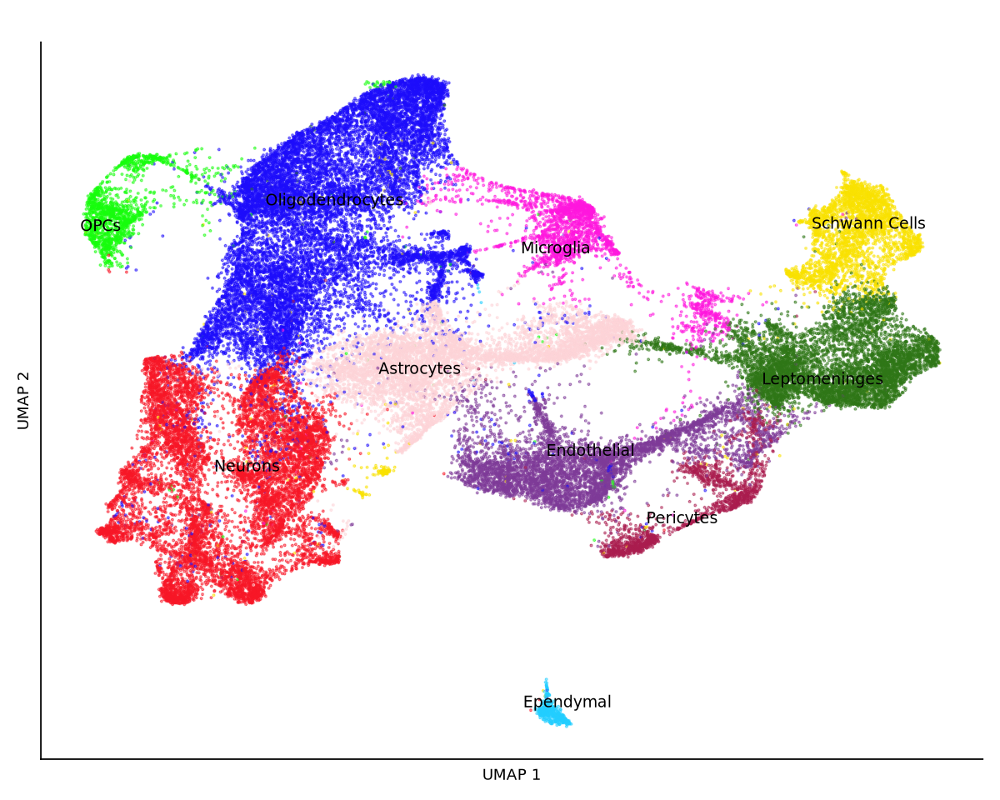

In [42]:
p <- DimPlot(xenium.obj, reduction = "umap", cols = colors_neurons_glia, pt.size = .5, alpha = 0.5,
          group.by = "tentative_labels", label = TRUE,label.size = 4, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_text(size = 11),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 11),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="", x ="UMAP 1", y ="UMAP 2")
print(p)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","xenium_all_cells_umap_",Sys.Date(),".pdf")), width = 4, height = 4)
print(p)
dev.off()


In [9]:
# Get number of features and genes per cluster

p <- VlnPlot(xenium.obj, features = c("nFeature_Xenium"), pt.size = 0, group.by = 'top_annotation', cols = colors_neurons_glia) +
            labs(title = "", x ="", y = "Total Genes Detected") + theme(legend.position = 'none')
print(p)

p2 <- VlnPlot(xenium.obj, features = c("nCount_Xenium"), pt.size = 0, group.by = 'top_annotation', cols = colors_neurons_glia) +
            labs(title = "", x ="", y = "Total transcripts detected") + theme(legend.position = 'none') + ylim(0,1500)
print(p2)

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","nFeature_all_cells",Sys.Date(),".pdf")), width = 3.5, height = 5)
    print(p)
    dev.off()
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","nCount_all_cells",Sys.Date(),".pdf")), width = 3.5, height = 5)
    print(p2)
    dev.off()

}

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


ERROR: Error in eval(expr, envir, enclos): object 'colors_neurons_glia' not found


,Freq,CellType,CellTypeFreq
,<int>,<fct>,<chr>
1,9540,Neurons,Neurons 9540
2,1554,OPCs,OPCs 1554
3,13845,Oligodendrocytes,Oligodendrocytes 13845
4,5962,Astrocytes,Astrocytes 5962
5,2226,Microglia,Microglia 2226
6,464,Ependymal,Ependymal 464
7,3154,Schwann Cells,Schwann Cells 3154
8,6127,Leptomeninges,Leptomeninges 6127
9,1540,Pericytes,Pericytes 1540


png 
  2

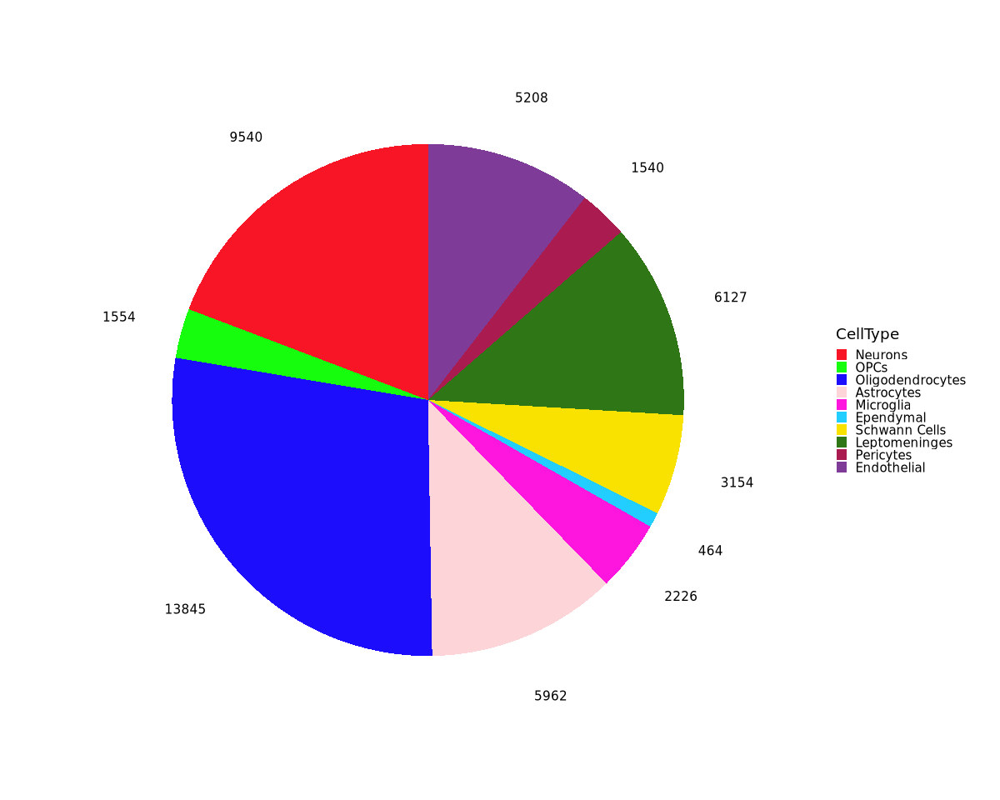

In [131]:
save = TRUE

cell_frequencies = as.data.frame(table(xenium.obj$tentative_labels))
cell_frequencies$CellType = cell_frequencies$Var1
cell_frequencies$CellTypeFreq = paste0(cell_frequencies$CellType,'\n',cell_frequencies$Freq)
cell_frequencies = subset(cell_frequencies, select = -c(Var1) )
cell_frequencies = cell_frequencies[cell_frequencies$CellType != 'Unknown',]
cell_frequencies

p = ggplot(cell_frequencies, aes(x="", y=Freq, fill=CellType)) +
  geom_bar(stat="identity", width=1) +
geom_text(aes(label = Freq, x = 1.75),
            position = position_stack(vjust = .5), size = (5/14)*9) +
  coord_polar("y", start=0) +
scale_fill_manual(values = colors_neurons_glia) + 
theme_void() + theme(legend.position = 'right', legend.text=element_text(size=9), legend.key.size = unit(.3, 'cm'))

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","piechart_all_cells",Sys.Date(),".pdf")), width = 3, height = 2)
    print(p)
    dev.off()

}

print(p)

# Integrate Xenium neurons with Russ et al neurons, find dorsal horn populations

In [ ]:
# subset to just the Xenium neurons

xenium.neurons <- subset(xenium.obj, seurat_clusters %in% c(4,6,8))
DefaultAssay(xenium.neurons) <- 'SCT'
xenium.neurons

In [44]:
# re-cluster just the neurons
#xenium.neurons <- SCTransform(xenium.neurons, assay = "Xenium")

xenium.neurons <- RunPCA(xenium.neurons, npcs = 30, features = rownames(xenium.neurons))
xenium.neurons <- RunUMAP(xenium.neurons, dims = 1:30)
xenium.neurons <- FindNeighbors(xenium.neurons, reduction = "pca", dims = 1:30)
xenium.neurons <- FindClusters(xenium.neurons, resolution = 0.3)

# mouse dorsal conserved dataset
mouse_neurons = mouse_dh_conserved_names


PC_ 1 
Positive:  Ebf3, Gad1, Slc17a6, Penk, Dner, Nrn1, Rims3, Lamp5, Calb2, Necab1 
	   Vat1l, Gad2, Nts, Pde11a, Pdyn, Calb1, Tmem255a, Plcxd3, Cbln1, Syt6 
	   Plcxd2, Dkk3, Cbln4, Garnl3, Cacna2d2, Cpne8, Rasgrf2, Necab2, Bdnf, Cpne4 
Negative:  Igf2, Gjc3, Dcn, Col1a1, Sox10, Fn1, Opalin, Fmod, Igfbp6, Ly6a 
	   Aldh1a2, Rbp4, Dpy19l1, Cldn5, Aqp4, Gng12, Slc13a4, Pdgfra, Id2, Gfap 
	   Ccn2, Clmn, Adgrl4, Cobll1, Laptm5, Zfp536, Slc39a12, Cd44, Acsbg1, Acta2 
PC_ 2 
Positive:  Pvalb, Gad1, Lamp5, Syt2, Gad2, Cabp7, Nrn1, Fhod3, Slit2, Meis2 
	   Hapln1, Strip2, Plcxd2, Rasgrf2, Cntnap4, Spp1, Col19a1, Cacna2d2, Epha4, Cntn6 
	   Thsd7a, Gucy1a1, Neurod6, Kcnmb2, Galnt14, Htr1f, Plcxd3, Sema5b, Nell1, Syndig1 
Negative:  Ebf3, Pde11a, Penk, Nts, Vat1l, Cpne8, Cd24a, Calb1, Necab1, Pdyn 
	   Calb2, Sox11, Arhgap6, Sst, Cbln1, Bdnf, Pcsk5, Gfap, Rprm, Rims3 
	   Tmem255a, Cbln4, Rab3b, Aqp4, Igf2, Igfbp5, 2010300C02Rik, Laptm5, Bcl11b, Crh 
PC_ 3 
Positive:  Gad1, Gad2, Pdyn, Vat1l

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 9540
Number of edges: 356925

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9322
Number of communities: 14
Elapsed time: 0 seconds


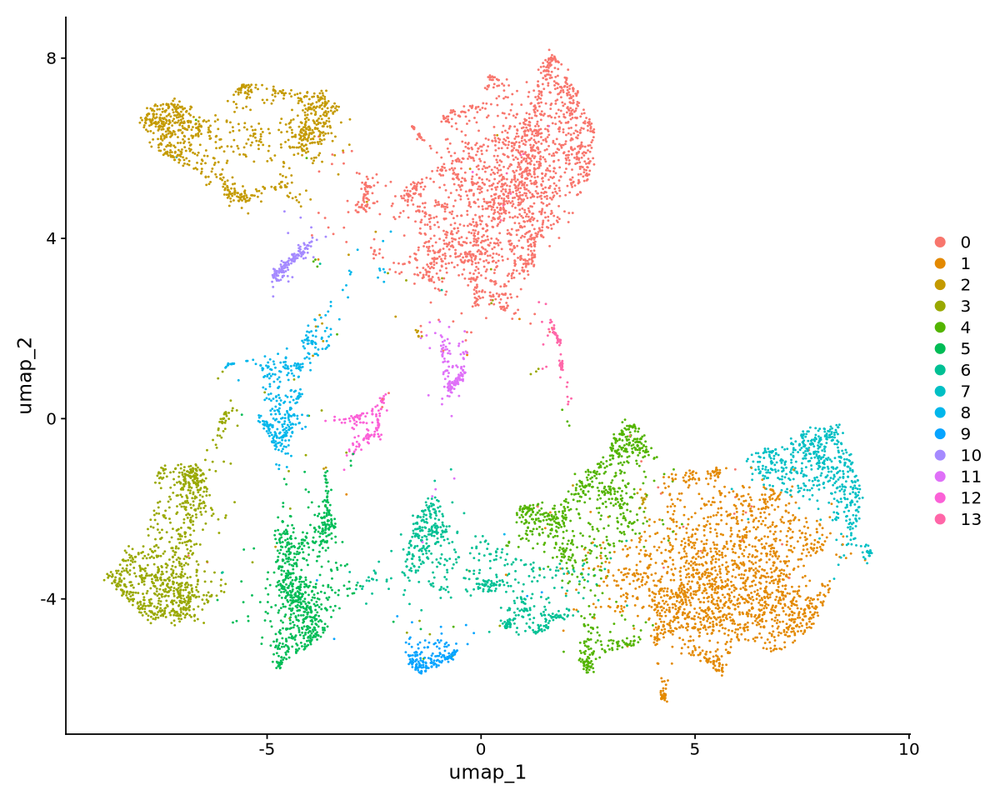

In [45]:
DimPlot(xenium.neurons)

In [22]:
## re-integrate just the neurons. Try with conserved families first
#mouse_dh_conserved_names$ignore_clusters <- mouse_dh_conserved_names$seurat_clusters
mouse_dh_conserved_names$seurat_clusters <- NA
features <- SelectIntegrationFeatures(  object.list = list(xenium.neurons, mouse_dh_conserved_names)  )
neurons.anchors <- FindIntegrationAnchors(object.list = list(xenium.neurons, mouse_dh_conserved_names), anchor.features = features, k.filter = NA)
neurons.combined <- IntegrateData(anchorset = neurons.anchors)#, normalization.method = "SCT")

No variable features found for object2 in the object.list. Running FindVariableFeatures ...

Warning message in FindVariableFeatures.Assay(object = object[[assay]], selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”
Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”
Warning message:
“Adding image data that isn't associated with any assays”
Finding neighborhoods

Finding anchors

	Found 9358 anchors

Merging dataset 2 into 1

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”
Warning message:
“Adding image data that isn't associated with any assays”
Extracting anchors for merged samples

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard

In [23]:
head(mouse_dh_conserved_names[[]])

,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT,orig.ident,percent.mt,dataset,final_cluster_assignment,coarse_cell_types,family,⋯,prediction.score.GABA3,prediction.score.GLUT3,prediction.score.GLUT10,prediction.score.GLUT11,prediction.score.GLUT7,prediction.score.GLUT8,prediction.score.max,conserved_marker_names,conserved_marker_nicknames,seurat_clusters
,<dbl>,<int>,<dbl>,<int>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>
SRR6040902_GTAGCTGGGGCN,971,585,1206,585,SRR6040902,0.0000000000,Sathyamurthy,Excit.16,Excit,Sox5,⋯,0.0000000,0,0,0,0,0,0.9849797,Exc-LMO3/TRPC3,Exc-LMO3,NA
SRR6040902_CTTTTTGCCTGG,8375,2975,1870,1033,SRR6040902,0.0003580807,Sathyamurthy,Inhib.01,Inhib,Rorb,⋯,0.0000000,0,0,0,0,0,0.8570950,Inh-SORCS1/SDK1,Inh-SORCS1,NA
SRR6040902_GGGCGTTTTCAG,1170,771,1270,771,SRR6040902,0.0000000000,Sathyamurthy,Inhib.02,Inhib,Adamts5,⋯,0.0000000,0,0,0,0,0,0.9543220,Inh-MEF2C/RORB,Inh-MEF2C,NA
SRR6040902_GTGGCGAAGGTN,4003,1822,2004,1229,SRR6040902,0.0004993758,Sathyamurthy,Excit.12,Excit,Rreb1,⋯,0.0000000,0,0,0,0,0,0.7333400,Exc-NMUR2/PREX2,Exc-NMUR2,NA
SRR6040902_TTCGATTAAAAG,1244,795,1306,795,SRR6040902,0.0016051364,Sathyamurthy,Excit.04,Excit,Prkcg,⋯,0.0000000,0,0,0,0,0,1.0000000,Exc-NTS/TSHZ2,Exc-NTS,NA
SRR6040902_TTTGTCGGTTTG,1347,796,1383,795,SRR6040902,0.0036982249,Sathyamurthy,Inhib.05,Inhib,Rorb,⋯,0.0281257,0,0,0,0,0,0.5726179,Inh-NXPH1/SDK2,Inh-NXPH1,NA


In [24]:
unique(neurons.combined$seurat_clusters)

[1] "12" "0"  "1"  "7"  "6"  "2"  "3"  "5"  "8"  "9"  "4"  "10" "11" "13" NA

In [25]:
# rename xenium clusters so they aren't overwritten when new clusters are found
neurons.combined$orig_xenium_clusters <- neurons.combined$seurat_clusters

# add species column
neurons.combined$species = ifelse(!is.na(neurons.combined$conserved_marker_nicknames), "russ", "xenium")
neurons.combined$integrated_celltype = ifelse(!is.na(neurons.combined$conserved_marker_nicknames), 
                                                neurons.combined$conserved_marker_nicknames, neurons.combined$orig_xenium_clusters)

# Run the standard workflow for visualization and clustering
neurons.combined <- ScaleData(neurons.combined, verbose = FALSE)
neurons.combined <- RunPCA(neurons.combined, npcs = 30, verbose = FALSE)
neurons.combined <- RunUMAP(neurons.combined, reduction = "pca", dims = 1:30, return.model = TRUE)
neurons.combined <- FindNeighbors(neurons.combined, reduction = "pca", dims = 1:30)
neurons.combined <- FindClusters(neurons.combined, resolution = 0.5)

UMAP will return its model

17:13:40 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:13:40 Read 13408 rows and found 30 numeric columns

17:13:40 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

17:13:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:13:42 Writing NN index file to temp file /tmp/RtmpGYHIhW/file215432d307fcb

17:13:42 Searching Annoy index using 1 thread, search_k = 3000

17:13:46 Annoy recall = 100%

17:13:47 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:13:49 Initializing

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13408
Number of edges: 520789

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9021
Number of communities: 16
Elapsed time: 1 seconds


In [26]:
table(neurons.combined$conserved_marker_nicknames)


    Exc-BNC2     Exc-LMO3      Exc-MAF     Exc-MAFA      Exc-NMU    Exc-NMUR2 
         176          291          447          126          278          285 
     Exc-NTS     Exc-PBX3    Exc-SKOR2    Exc-SNTB1     Exc-TAC3 Inh-CACNA2D3 
         154          184          219           95            1          267 
   Inh-MEF2C      Inh-NPY    Inh-NXPH1     Inh-PDYN    Inh-PDZD2   Inh-SORCS1 
         188          205          169          340          175          268 

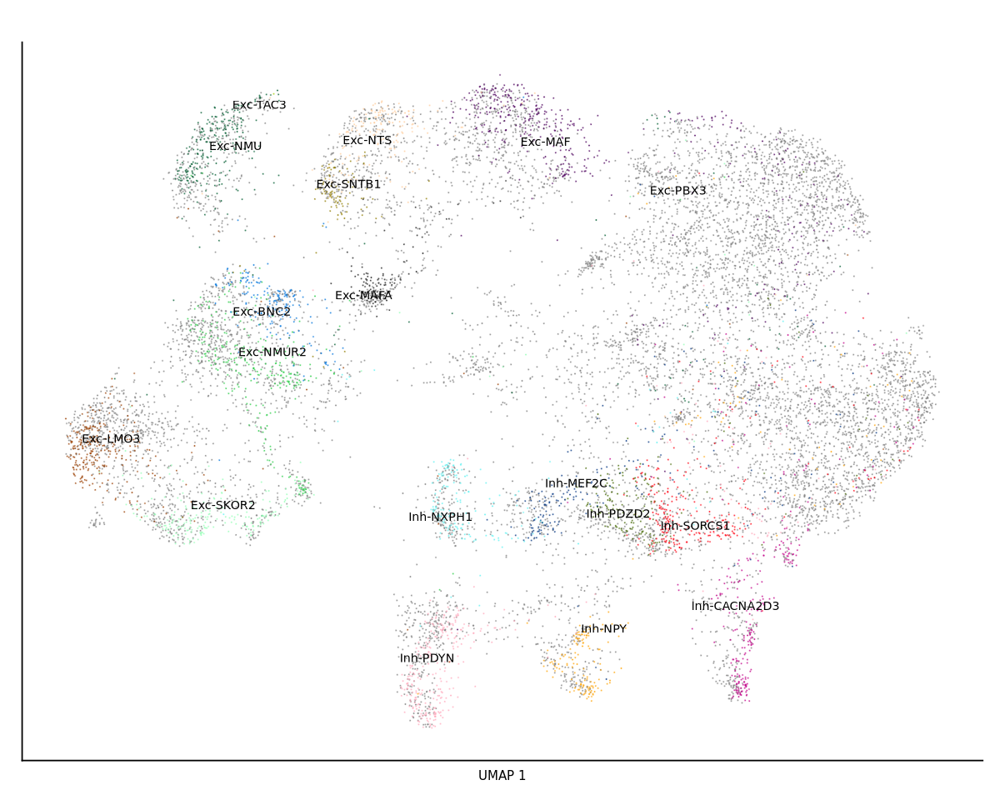

png 
  2

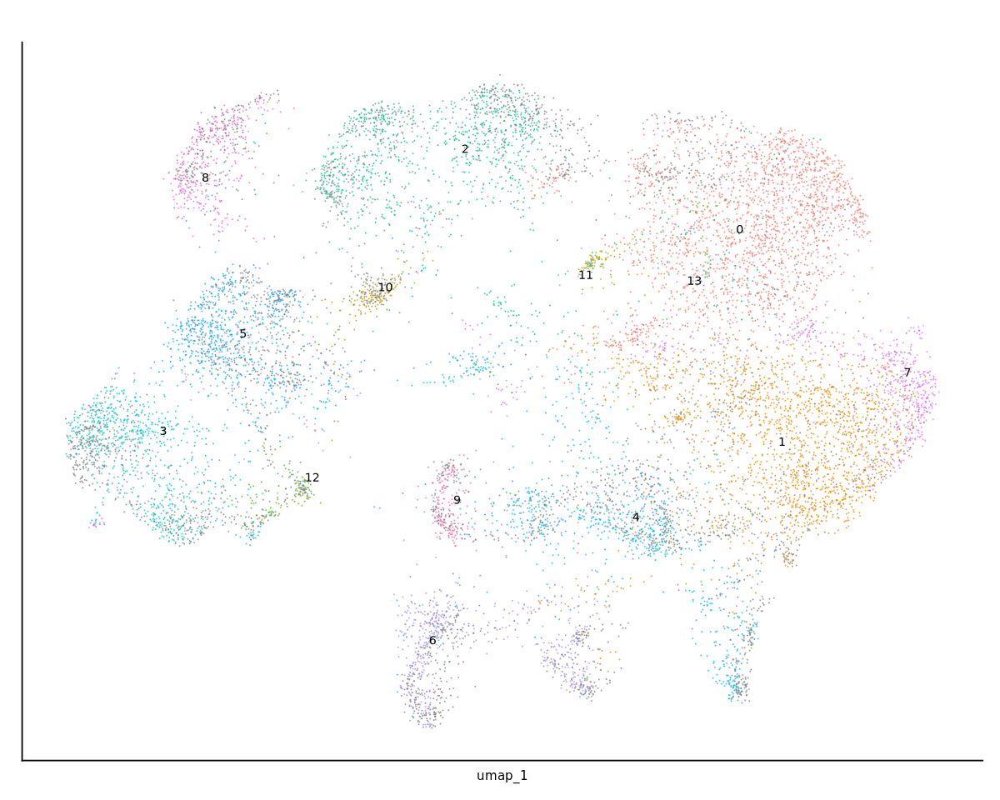

In [51]:
# visualize clusters


# p <- DimPlot(neurons.combined, reduction = "umap", cols = c(colors_macaque,'grey50'),
#              group.by = "conserved_marker_nicknames", label = FALSE,label.size = 7, repel = TRUE)
# print(p)

# p2 <- DimPlot(neurons.combined, reduction = "umap", #cols = colors_macaque[1:15],
#               group.by = "orig_xenium_clusters", label = TRUE, 
#               label.size = 7, repel = TRUE)
# print(p2)



p <- DimPlot(neurons.combined, reduction = "umap", cols = c(colors_macaque,'grey90'), pt.size = 0.00001, alpha = 0.5,
          group.by = "conserved_marker_nicknames", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="", x ="UMAP 1", y ="UMAP 2")
print(p)
#p =LabelClusters(p, id = "conserved_marker_nicknames",  fontface = "bold", force = 5, max_time = 5)

p2 <- DimPlot(neurons.combined, reduction = "umap", pt.size = 0.00001, alpha = 0.5,
          group.by = "orig_xenium_clusters", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="", y ="UMAP 2")
print(p2)

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_neurons_withMidvent_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p)
    dev.off()
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_xenium_neurons_withMidvent_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p2)
    dev.off()

}


In [28]:
# subset and integrate one more time removing likely midvent and vent
clusters_to_remove = c(0,1,7,11,13)
seq = 1:length(unique(xenium.neurons$seurat_clusters))
clusters_to_keep = seq[!(seq %in% clusters_to_remove)]
clusters_to_keep
xenium.dh <- subset(xenium.neurons, seurat_clusters %in% clusters_to_keep)

xenium.dh <- RunPCA(xenium.dh, npcs = 30, features = rownames(xenium.dh))
xenium.dh <- RunUMAP(xenium.dh, dims = 1:30)
xenium.dh <- FindNeighbors(xenium.dh, reduction = "pca", dims = 1:30)
xenium.dh <- FindClusters(xenium.dh, resolution = .6)

[1]  2  3  4  5  6  8  9 10 12 14

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
PC_ 1 
Positive:  Ebf3, Penk, Pde11a, Nts, Necab1, Vat1l, Calb2, Rims3, Gad1, Dner 
	   Calb1, Slc17a6, Cpne8, Cd24a, Cbln1, Tmem255a, Pdyn, Sox11, Sst, Cbln4 
	   Necab2, Bdnf, Syt6, Rab3b, Arhgap6, Nwd2, Bcl11b, Pcsk5, Garnl3, Kcnh5 
Negative:  Igf2, Gjc3, Dcn, Col1a1, Sox10, Fn1, Opalin, Fmod, Igfbp6, Dpy19l1 
	   Ly6a, Aldh1a2, Spp1, Rbp4, Cabp7, Cldn5, Ccn2, Gng12, Slc13a4, Id2 
	   Zfp536, Clmn, Adgrl4, Pdgfra, Acsbg1, Slc39a12, Sncg, Cobll1, Prox1, Aqp4 
PC_ 2 
Positive:  Pdyn, Pde11a, Vat1l, Calb2, Cd24a, Ebf3, Cbln4, Gad1, Tmem255a, Necab1 
	   Nwd2,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4832
Number of edges: 191219

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9012
Number of communities: 15
Elapsed time: 0 seconds


In [29]:
xenium.dh <- FindClusters(xenium.dh, resolution = 1)
# I tried resolution 1.2 and it didn't resolve GABA2 subtypes

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4832
Number of edges: 191219

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8695
Number of communities: 17
Elapsed time: 0 seconds


In [30]:
# re-integrate just the dorsal horn. Try with conserved families first
features <- SelectIntegrationFeatures(  object.list = list(xenium.dh, mouse_dh_conserved_names)  )
dh.anchors <- FindIntegrationAnchors(object.list = list(xenium.dh, mouse_dh_conserved_names), anchor.features = features, k.filter = NA)
dh.combined <- IntegrateData(anchorset = dh.anchors)#, normalization.method = "SCT")

# rename xenium clusters so they aren't overwritten when new clusters are found
dh.combined$orig_xenium_clusters <- dh.combined$seurat_clusters

# add species column
dh.combined$species = ifelse(!is.na(dh.combined$conserved_marker_nicknames), "russ", "xenium")
dh.combined$integrated_celltype = ifelse(!is.na(dh.combined$conserved_marker_nicknames), 
                                                dh.combined$conserved_marker_nicknames, dh.combined$orig_xenium_clusters)

# Run the standard workflow for visualization and clustering
dh.combined <- ScaleData(dh.combined, verbose = FALSE)
dh.combined <- RunPCA(dh.combined, npcs = 30, verbose = FALSE)
dh.combined <- RunUMAP(dh.combined, reduction = "pca", dims = 1:30, return.model = TRUE)
dh.combined <- FindNeighbors(dh.combined, reduction = "pca", dims = 1:30)
dh.combined <- FindClusters(dh.combined, resolution = 0.5)

No variable features found for object2 in the object.list. Running FindVariableFeatures ...

Warning message in FindVariableFeatures.Assay(object = object[[assay]], selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”
Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”
Warning message:
“Adding image data that isn't associated with any assays”
Finding neighborhoods

Finding anchors

	Found 7872 anchors

Merging dataset 2 into 1

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”
Warning message:
“Adding image data that isn't associated with any assays”
Extracting anchors for merged samples

Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 8700
Number of edges: 374544

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9105
Number of communities: 14
Elapsed time: 0 seconds


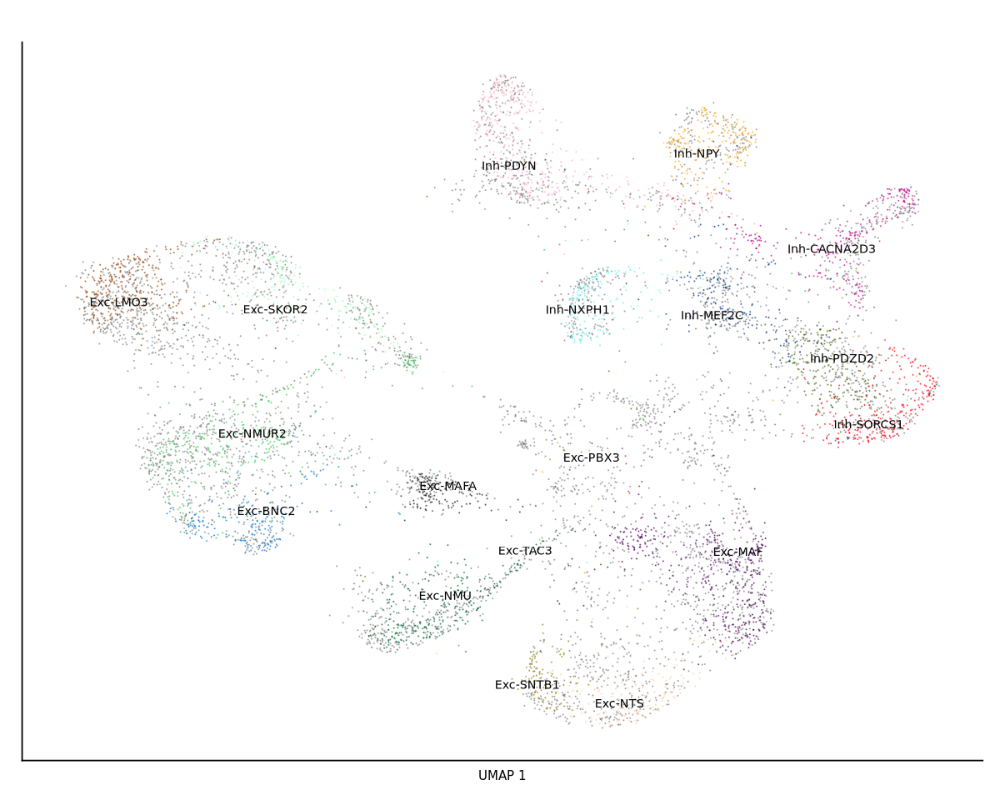

png 
  2

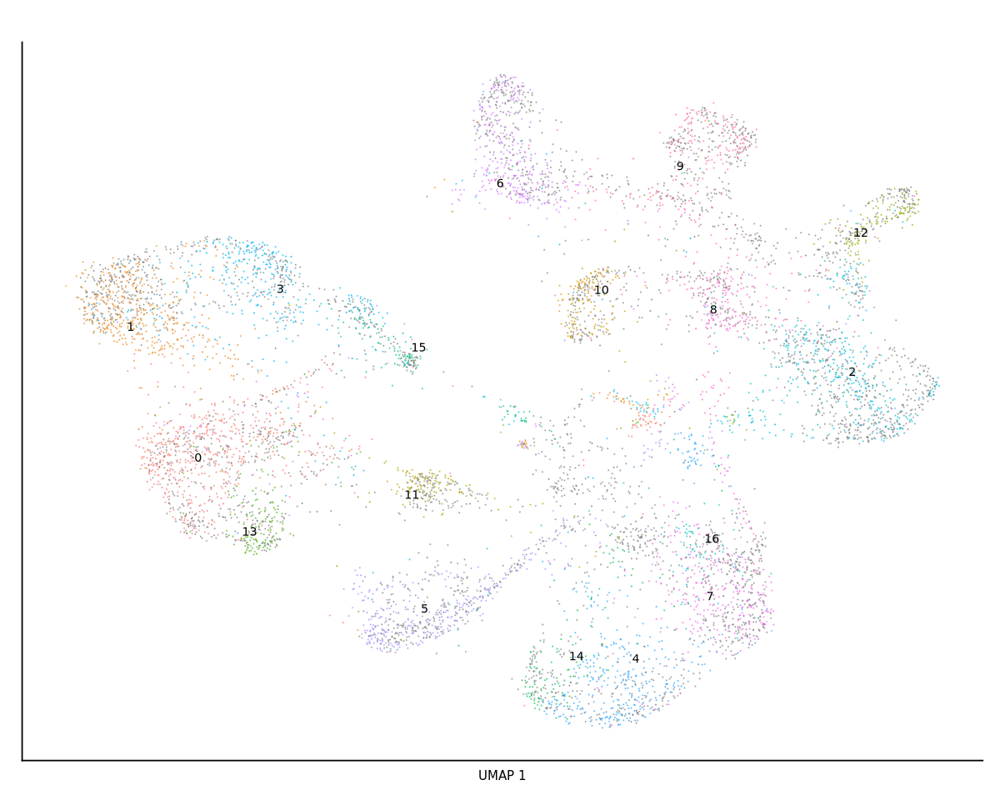

In [52]:
# visualize clusters
options(repr.plot.width=10, repr.plot.height=8)

p <- DimPlot(dh.combined, reduction = "umap", cols = c(colors_macaque,'grey90'), pt.size = 0.00001, alpha = 0.5,
          group.by = "conserved_marker_nicknames", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="", x ="UMAP 1", y ="UMAP 2")
print(p)

p2 <- DimPlot(dh.combined, reduction = "umap", pt.size = 0.00001, alpha = 0.5,
          group.by = "orig_xenium_clusters", label = TRUE,label.size = 3, repel = TRUE) + theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),axis.title.x=element_text(size = 9),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=3), axis.text=element_text(size=10),
                                                                     legend.position = "none") + 
            labs(title="", x ="UMAP 1", y ="UMAP 2")
print(p2)

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_neurons_DH_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p)
    dev.off()
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","integrated_xenium_neurons_DH_",Sys.Date(),".pdf")), width = 3.5, height = 3.5)
    print(p2)
    dev.off()

}

In [32]:
cluster_names = c('Exc-NMUR2', 'Exc-LMO3', 'Inh-SORCS1 & PDZD2', 'Exc-SKOR2', 'Exc-NTS',
                 'Exc-NMU & TAC3', 'Inh-PDYN', 'Exc-MAF','Inh-MEF2C', 'Inh-NPY', 'Inh-NXPH1',
                 'Exc-MAFA', 'Inh-CACNA2D3', 'Exc-BNC2', 'Exc-SNTB1', 'Unlabeled', 'Exc-MAF')
xenium.dh$tentative_labels <- ''

for (ii in sort(unique(xenium.dh$seurat_clusters))  ){

    xenium.dh$tentative_labels[xenium.dh$seurat_clusters == as.numeric(ii)] = cluster_names[as.numeric(ii)+1]
}

ordered_cluster_names = c('Exc-BNC2','Exc-NMUR2', 'Exc-NMU & TAC3','Exc-LMO3', 'Exc-SKOR2', 'Exc-MAF', 'Exc-MAFA', 
                  'Exc-NTS', 'Exc-SNTB1', 'Inh-CACNA2D3', 'Inh-SORCS1 & PDZD2', 'Inh-NPY', 'Inh-MEF2C','Inh-NXPH1','Inh-PDYN', 
                          'Unlabeled')
xenium.dh$tentative_labels <- factor(xenium.dh$tentative_labels, levels = ordered_cluster_names)
Idents(xenium.dh) <- 'tentative_labels'

png 
  2

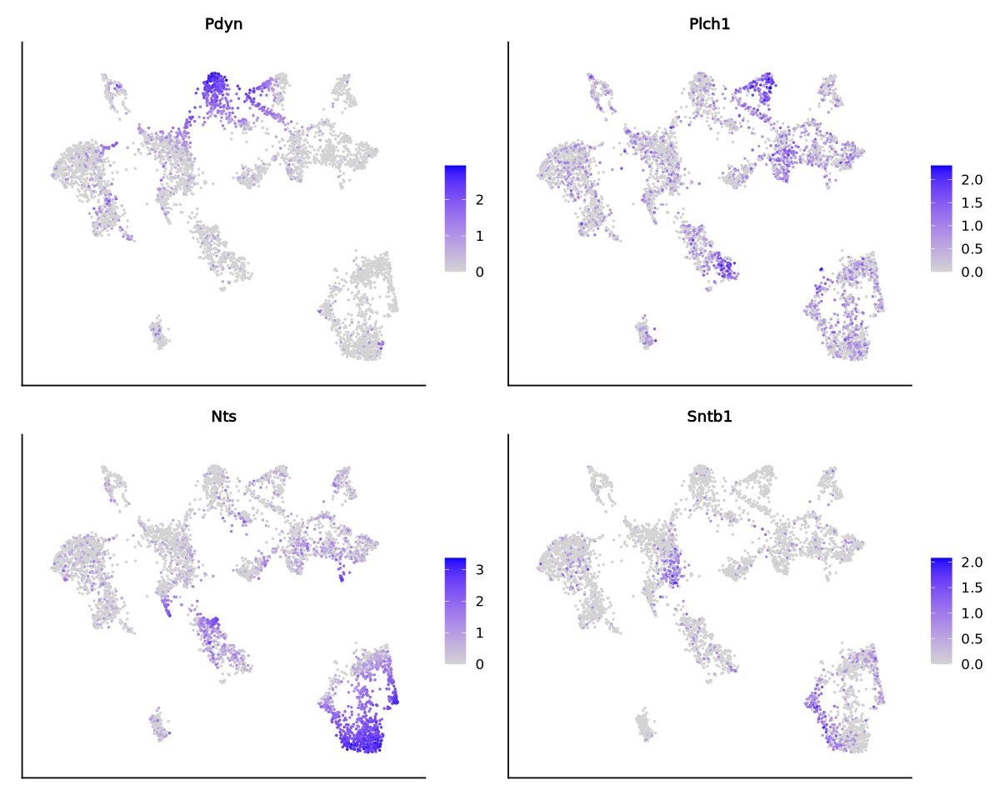

png 
  2

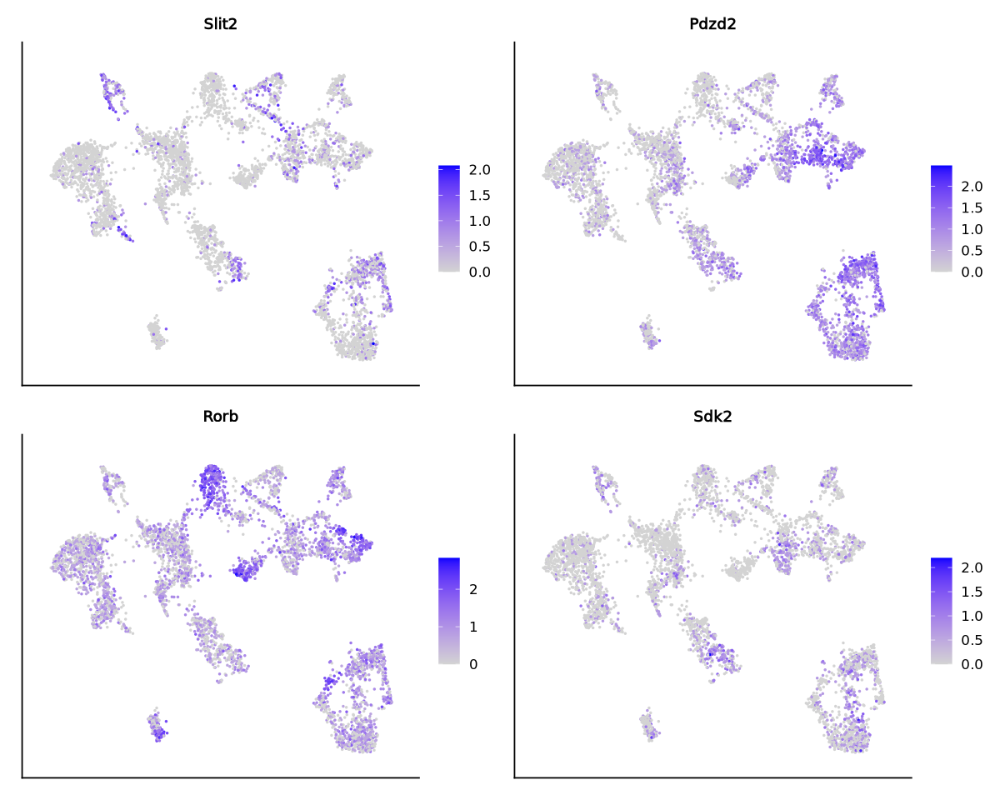

png 
  2

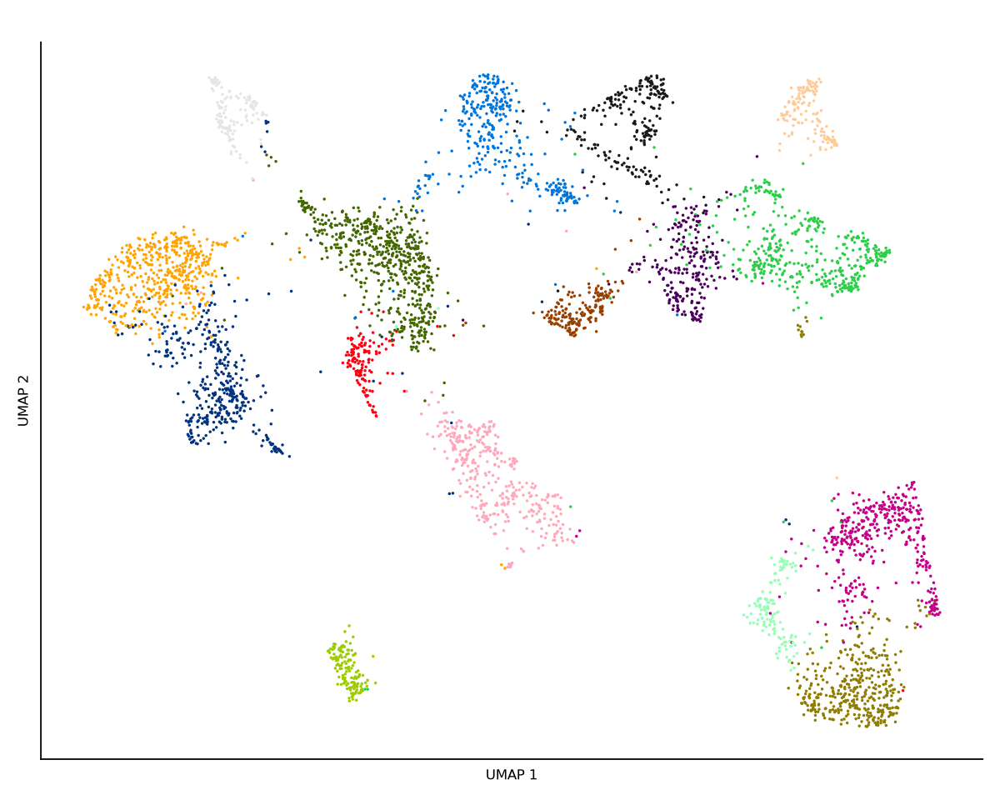

png 
  2

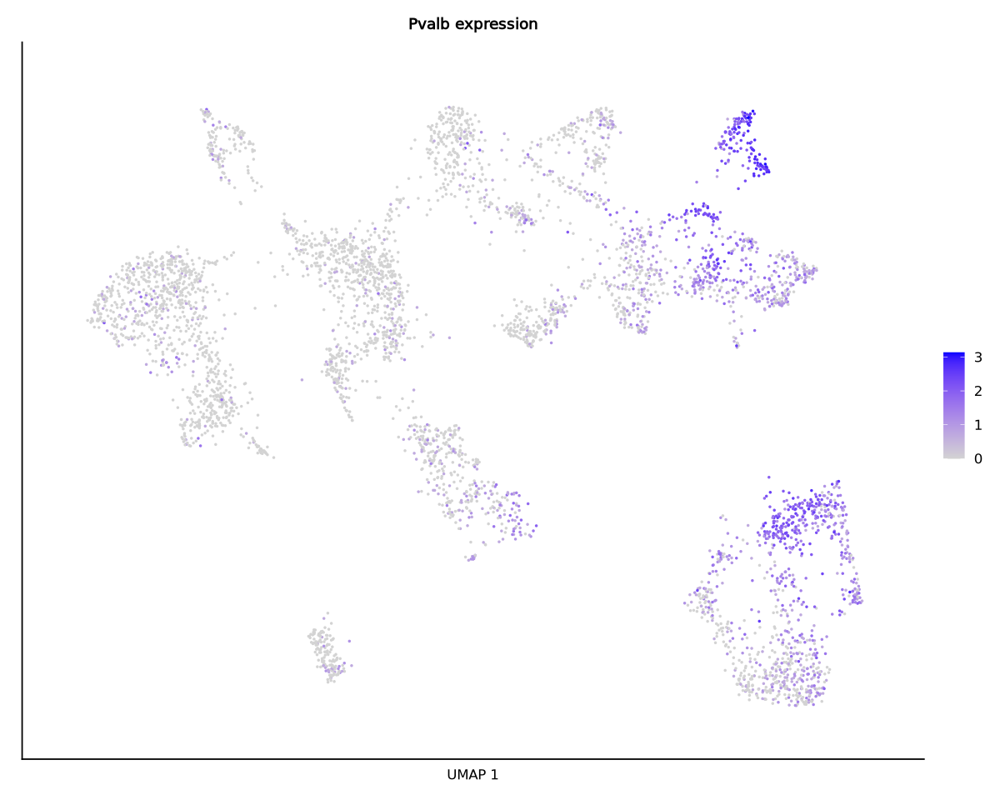

In [50]:

p2 <- FeaturePlot(xenium.dh, reduction = "umap", features = c('Pdyn','Plch1','Nts','Sntb1'),
              label.size = 5, repel = TRUE, ncol = 2, combine = TRUE) &
        theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(), axis.title.x=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "right")
print(p2)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","available_marker_genes_part1_",Sys.Date(),".pdf")), width = 7.5, height = 8)
print(p2)
dev.off()

p2 <- FeaturePlot(xenium.dh, reduction = "umap", features = c('Slit2','Pdzd2','Rorb','Sdk2'),
              label.size = 5, repel = TRUE, ncol = 2, combine = TRUE) &
        theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(), axis.title.x=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "right")
print(p2)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","available_marker_genes_part2_",Sys.Date(),".pdf")), width = 7.5, height = 8)
print(p2)
dev.off()



p1 <- DimPlot(xenium.dh, reduction = "umap", cols = rev(c('grey90',colors_new_labels)),
              group.by = "tentative_labels", label = FALSE, 
              label.size = 4.5, repel = TRUE) + guides(fill=guide_legend(ncol=2)) + 
            theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_text(size = 10), axis.title.x=element_text(size = 10),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "none", legend.direction = 'horizontal') +
            labs(title="", x ="UMAP 1", y ="UMAP 2")
    
print(p1)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","xenium_umap_DH_neurons_",Sys.Date(),".pdf")), width = 4, height = 3.5)
    print(p1)
dev.off()


p3 <- FeaturePlot(xenium.dh, reduction = "umap", features = c('Pvalb')) + 
theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_blank(), axis.title.x=element_text(size = 10),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "right")+
labs(title="Pvalb expression", x ="UMAP 1", y ="UMAP 2")
print(p3)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","pvalb_dimplot_",Sys.Date(),".pdf")), width = 4, height = 4)
    print(p3)
dev.off()

In [53]:
library(grid)
library(gridExtra) 
p1 <- DimPlot(xenium.dh, reduction = "umap", cols = rev(c('grey90',colors_new_labels)),
              group.by = "tentative_labels", label = FALSE, 
              label.size = 4.5, repel = TRUE) + guides(fill=guide_legend(ncol=2)) + 
            theme(axis.text.y=element_blank(), axis.ticks.y=element_blank(), axis.title.y=element_text(size = 10), axis.title.x=element_text(size = 10),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                                                    plot.title = element_text(size = 11), legend.text=element_text(size=10), axis.text=element_text(size=10),
                                                                     legend.position = "right", legend.direction = 'vertical') +
            labs(title="Xenium Dorsal Horn Neurons", x ="UMAP 1", y ="UMAP 2") +


legend <- cowplot::get_legend(p1)
pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","xenium_dh_justlegend_",Sys.Date(),".pdf")), width = 2, height = 3.5)
grid.newpage()
grid.draw(legend)

dev.off()

png 
  2

,Freq,CellType,CellTypeFreq
,<int>,<fct>,<chr>
1,135,Exc-BNC2,Exc-BNC2 135
2,611,Exc-NMUR2,Exc-NMUR2 611
3,371,Exc-NMU & TAC3,Exc-NMU & TAC3 371
4,521,Exc-LMO3,Exc-LMO3 521
5,404,Exc-SKOR2,Exc-SKOR2 404
6,408,Exc-MAF,Exc-MAF 408
7,142,Exc-MAFA,Exc-MAFA 142
8,403,Exc-NTS,Exc-NTS 403
9,129,Exc-SNTB1,Exc-SNTB1 129


png 
  2

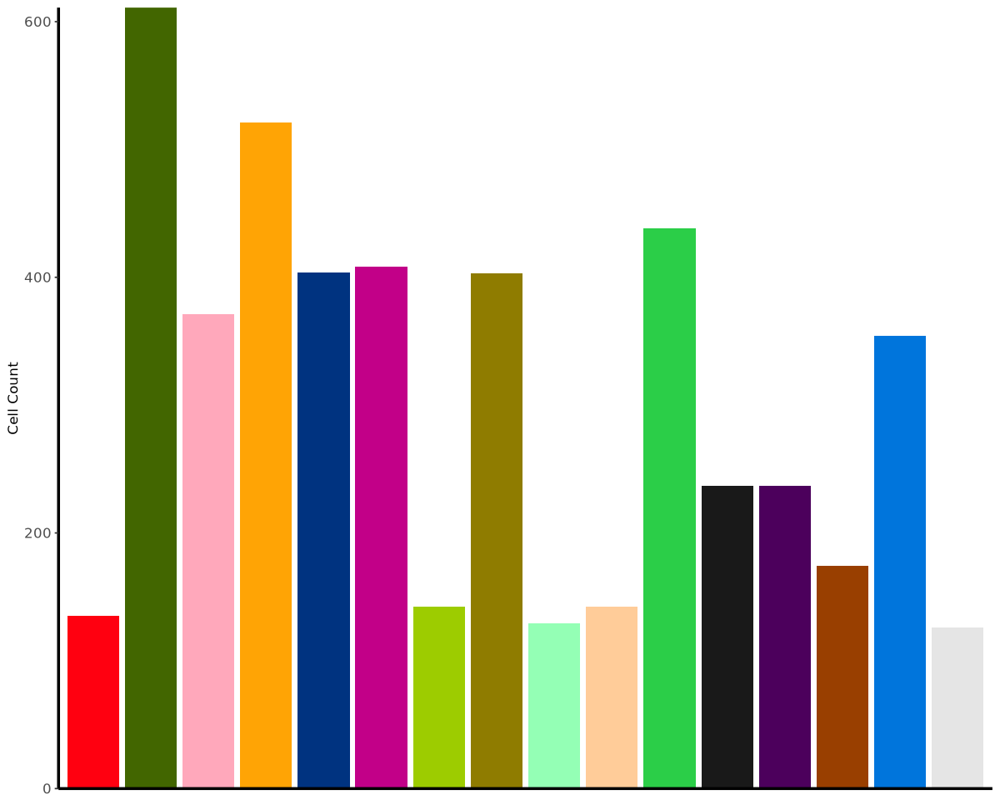

In [160]:
save = TRUE

cell_frequencies = as.data.frame(table(xenium.dh$tentative_labels))
cell_frequencies$CellType = cell_frequencies$Var1
cell_frequencies$CellType = factor(cell_frequencies$CellType, levels = ordered_cluster_names)
cell_frequencies$CellTypeFreq = paste0(cell_frequencies$CellType,'\n',cell_frequencies$Freq)
cell_frequencies = subset(cell_frequencies, select = -c(Var1) )
cell_frequencies = cell_frequencies[cell_frequencies$CellType != 'Unknown',]
cell_frequencies

library(ggplot2)
# Basic barplot
p <-ggplot(data=cell_frequencies, aes(x=CellType, y=Freq, fill = CellType)) +
  geom_bar(stat="identity") + scale_y_continuous(expand = c(0,0)) +
theme(axis.text.y=element_text(size = 10), axis.title.y=element_text(size = 10), axis.title.x=element_blank(),
                                                                    axis.ticks.x=element_blank(),axis.text.x=element_blank(),
                                   axis.line.x = element_line(color="black", size = 1), axis.line.y = element_line(color="black", size = 1),
                                   plot.background  = element_rect(fill = "white"),
                                    panel.background = element_rect(fill = "white"),
                                    panel.grid.major = element_blank(),
                                 panel.grid.minor = element_blank(), legend.position = 'none') +
labs(y = 'Cell Count') + scale_fill_manual(values = rev( c('grey90',colors_new_labels) )    )
   
if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","bar_dh_neurons",Sys.Date(),".pdf")), width = 4, height = 3)
    print(p)
    dev.off()

}

print(p)

In [35]:
p = RidgePlot(xenium.dh, features = c('Pvalb'), cols = rev(c('grey50',colors_new_labels))) +
    theme(legend.position = "none")

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","pvalb_ridge_",Sys.Date(),".pdf")), width = 7.5, height = 5)
print(p)
dev.off()

Picking joint bandwidth of 0.073



png 
  2

In [21]:
xenium.dh_notIntegrated = xenium.obj[,xenium.obj$top_annotation == 'Neurons']
xenium.dh_notIntegrated = xenium.dh_notIntegrated[,xenium.dh_notIntegrated$subtype_annotation != 'Mid and Ventral Neurons' ]
table(xenium.dh_notIntegrated$subtype_annotation)

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”



          Exc-BNC2           Exc-LMO3            Exc-MAF           Exc-MAFA 
               135                521                408                142 
    Exc-NMU & TAC3          Exc-NMUR2            Exc-NTS          Exc-SKOR2 
               371                611                403                404 
         Exc-SNTB1       Inh-CACNA2D3          Inh-MEF2C            Inh-NPY 
               129                142                237                237 
         Inh-NXPH1           Inh-PDYN Inh-SORCS1 & PDZD2          Unlabeled 
               174                354                438                126 

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


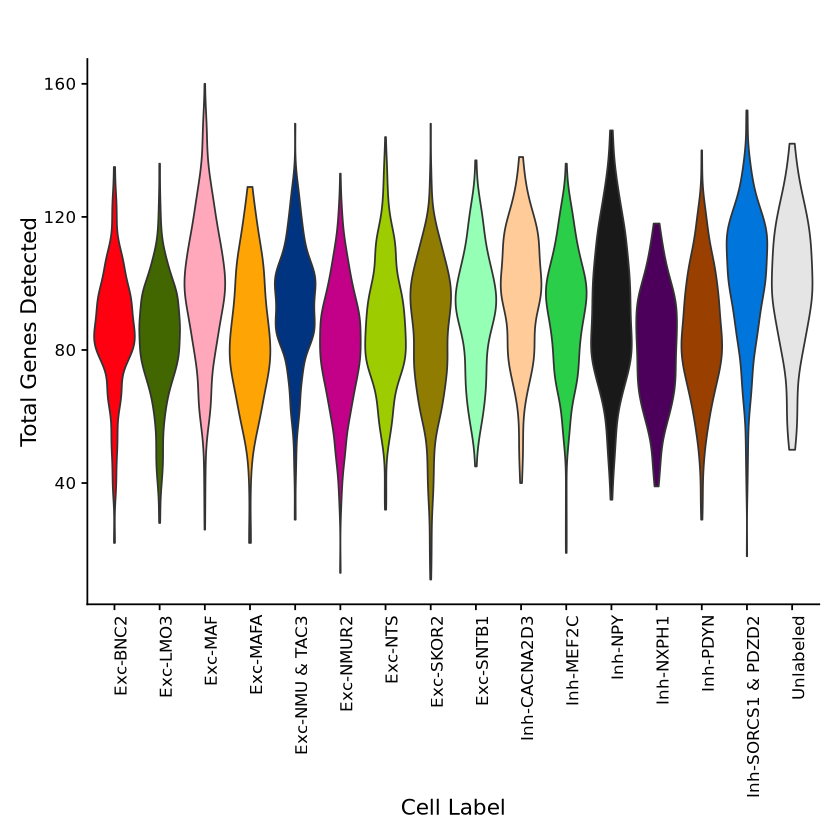

png 
  2

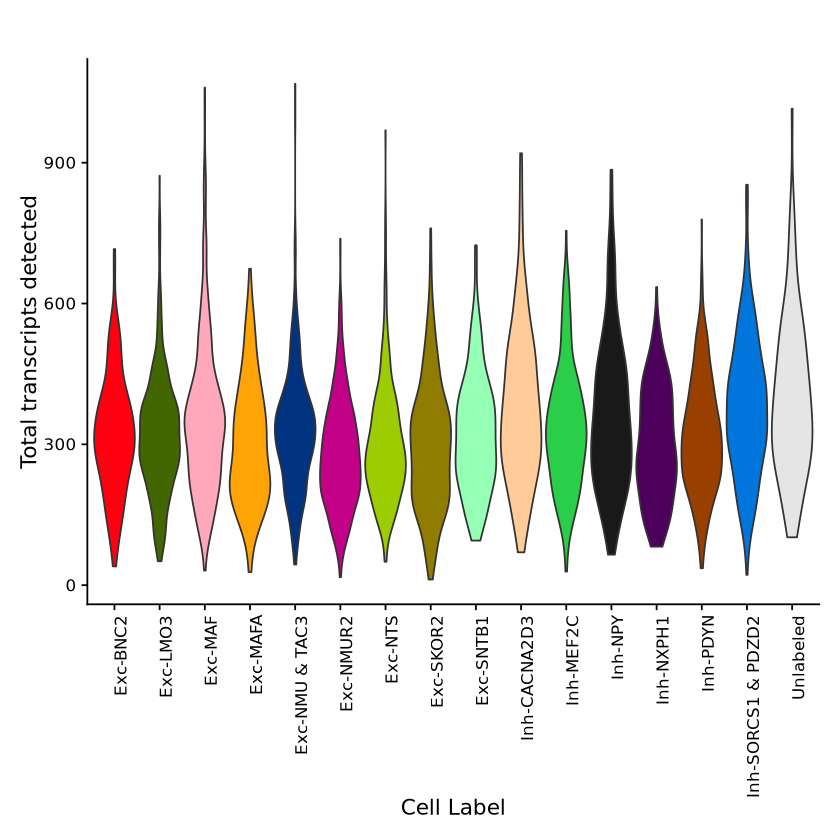

In [28]:


# Get number of features and genes per cluster

# p <- VlnPlot(xenium.dh, features = c("nFeature_Xenium"), pt.size = 0, group.by = 'tentative_labels', cols =  rev(c('grey90',colors_new_labels)) ) +
#             labs(title = "", x ="Cell Label", y = "Total Genes Detected") + theme(legend.position = 'none') + 
#             theme(axis.text.y=element_text(size = 9), axis.title.y=element_text(size = 10), axis.title.x=element_text(size = 9),
#                                                                     axis.text.x=element_text(size = 10) )
# print(p)

# p2 <- VlnPlot(xenium.dh, features = c("nCount_Xenium"), pt.size = 0, group.by = 'tentative_labels', cols = rev(c('grey90',colors_new_labels)) ) +
#             labs(title = "", x ="Cell Label", y = "Total transcripts detected") + theme(legend.position = 'none') + 
#             theme(axis.text.y=element_text(size = 9), axis.title.y=element_text(size = 10), axis.title.x=element_text(size = 9),
#                                                                     axis.text.x=element_text(size = 10) )
# print(p2)

p <- VlnPlot(xenium.dh_notIntegrated, features = c("nFeature_Xenium"), pt.size = 0, group.by = 'subtype_annotation', cols =  rev(c('grey90',colors_new_labels)) ) +
            labs(title = "", x ="Cell Label", y = "Total Genes Detected") + theme(legend.position = 'none') + 
            theme(axis.text.y=element_text(size = 10), axis.title.y=element_text(size = 13), axis.title.x=element_text(size = 13),
                                                                    axis.text.x=element_text(size = 10, angle = 90) )
print(p)

p2 <- VlnPlot(xenium.dh_notIntegrated, features = c("nCount_Xenium"), pt.size = 0, group.by = 'subtype_annotation', cols = rev(c('grey90',colors_new_labels)) ) +
            labs(title = "", x ="Cell Label", y = "Total transcripts detected") + theme(legend.position = 'none') + 
            theme(axis.text.y=element_text(size = 10), axis.title.y=element_text(size = 13), axis.title.x=element_text(size = 13),
                                                                    axis.text.x=element_text(size = 10, angle = 90) )
print(p2)

if (save == TRUE){
    
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","nFeature_dh_neurons",Sys.Date(),".pdf")), width = 3.5, height = 5.5)
    print(p)
    dev.off()
    pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/","nCount_dh_neurons",Sys.Date(),".pdf")), width = 3.5, height = 5.5)
    print(p2)
    dev.off()

}

# Save labelings for full xenium object

In [188]:
xenium.obj$top_annotation <- xenium.obj$tentative_labels
xenium.obj$subtype_annotation <- ''
for (celltype in unique(xenium.dh$tentative_labels)){
    dh_cell_list = as.character(colnames(xenium.dh[,xenium.dh$tentative_labels == celltype]) )
    xenium.obj$subtype_annotation[colnames(xenium.obj) %in% dh_cell_list] <- celltype
    }

for (celltype in unique(xenium.obj$top_annotation)){
    if (celltype !='Neurons'){
        xenium.obj$subtype_annotation[xenium.obj$top_annotation == celltype] = celltype
        }
}
xenium.obj$subtype_annotation[xenium.obj$subtype_annotation == ''] = 'Mid and Ventral Neurons'

In [204]:
table(xenium.obj$top_annotation)
table(xenium.obj$subtype_annotation)
table(xenium.dh$tentative_labels)

saveRDS(xenium.obj$top_annotation, file = "/projects/pfenninggroup/spatial/seal/mouse_spinal_cord_xenium_first_run/rdas/first_run_saline_top_annotation.rds")
saveRDS(xenium.obj$subtype_annotation, file = "/projects/pfenninggroup/spatial/seal/mouse_spinal_cord_xenium_first_run/rdas/first_run_saline_subtype_annotation.rds")


         Neurons             OPCs Oligodendrocytes       Astrocytes 
            9540             1554            13845             5962 
       Microglia        Ependymal    Schwann Cells    Leptomeninges 
            2226              464             3154             6127 
       Pericytes      Endothelial          Unknown 
            1540             5208                0 


             Astrocytes             Endothelial               Ependymal 
                   5962                    5208                     464 
               Exc-BNC2                Exc-LMO3                 Exc-MAF 
                    135                     521                     408 
               Exc-MAFA          Exc-NMU & TAC3               Exc-NMUR2 
                    142                     371                     611 
                Exc-NTS               Exc-SKOR2               Exc-SNTB1 
                    403                     404                     129 
           Inh-CACNA2D3               Inh-MEF2C                 Inh-NPY 
                    142                     237                     237 
              Inh-NXPH1                Inh-PDYN      Inh-SORCS1 & PDZD2 
                    174                     354                     438 
          Leptomeninges               Microglia Mid and Ventral Neurons 
                   6127                    2226   


          Exc-BNC2          Exc-NMUR2     Exc-NMU & TAC3           Exc-LMO3 
               135                611                371                521 
         Exc-SKOR2            Exc-MAF           Exc-MAFA            Exc-NTS 
               404                408                142                403 
         Exc-SNTB1       Inh-CACNA2D3 Inh-SORCS1 & PDZD2            Inh-NPY 
               129                142                438                237 
         Inh-MEF2C          Inh-NXPH1           Inh-PDYN          Unlabeled 
               237                174                354                126 

# Crop and find labeled cells in space

In [42]:
# anchors <- FindTransferAnchors(reference = human_rna, query = xenium.obj, normalization.method = "SCT")
# predictions.assay <- TransferData(anchorset = anchors, refdata = human_rna$top_level_annotation, prediction.assay = TRUE,
#     weight.reduction = xenium.obj[["pca"]], dims = 1:30)
# xenium.obj[["top_level_annotation"]] <- predictions.assay

Normalizing query using reference SCT model

Warning message:
“No layers found matching search pattern provided”


ERROR: Error: No features to use in finding transfer anchors. To troubleshoot, try explicitly providing features to the features parameter and ensure that they are present in both reference and query assays.


In [54]:
cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(3100, 5000), x = c(100, 3000), coords = "plot")
xenium.neurons[["s1"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(3300, 5200), x = c(3500, 6000), coords = "plot")
xenium.neurons[["s2"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(3000, 5600), x = c(6500, 10000), coords = "plot")
xenium.neurons[["s3"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(300, 2500), x = c(3500, 6500), coords = "plot")
xenium.neurons[["s4"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(500, 2500), x = c(7500, 10500), coords = "plot")
xenium.neurons[["s5"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(0, 2600), x = c(11000, 14500), coords = "plot")
xenium.neurons[["s6"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(700, 2600), x = c(15000, 18000), coords = "plot")
xenium.neurons[["s7"]] <- cropped.coords

cropped.coords <- Crop(xenium.neurons[["fov"]], y = c(1500, 3100), x = c(18000, 22000), coords = "plot")
xenium.neurons[["s8"]] <- cropped.coords

### DH only
cropped.coords <- Crop(xenium.dh[["fov"]], y = c(3100, 5000), x = c(100, 3000), coords = "plot")
xenium.dh[["s1"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(3300, 5200), x = c(3500, 6000), coords = "plot")
xenium.dh[["s2"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(3000, 5600), x = c(6500, 10000), coords = "plot")
xenium.dh[["s3"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(300, 2500), x = c(3500, 6500), coords = "plot")
xenium.dh[["s4"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(500, 2500), x = c(7500, 10500), coords = "plot")
xenium.dh[["s5"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(0, 2600), x = c(11000, 14500), coords = "plot")
xenium.dh[["s6"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(700, 2600), x = c(15000, 18000), coords = "plot")
xenium.dh[["s7"]] <- cropped.coords

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1500, 3100), x = c(18000, 22000), coords = "plot")
xenium.dh[["s8"]] <- cropped.coords

Warning message:
“Key ‘Xenium_’ taken, using ‘s1_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s2_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s3_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s4_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s5_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s6_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s7_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s8_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s1_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s2_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s3_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s4_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s5_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s6_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s7_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s8_’ instead”


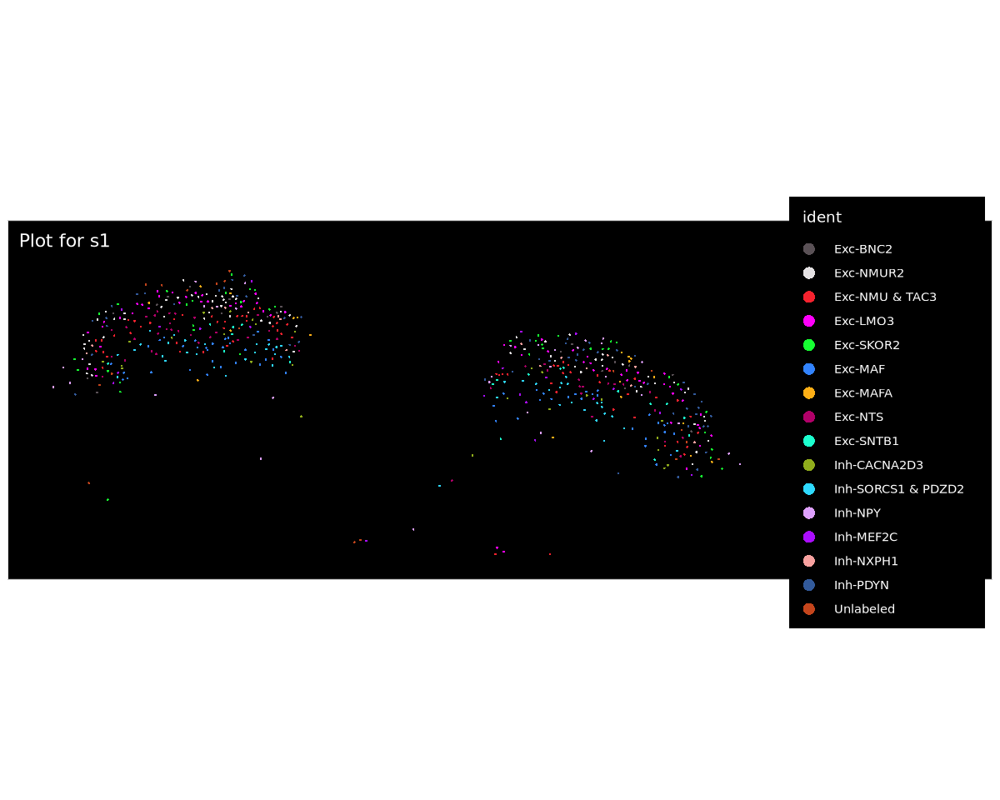

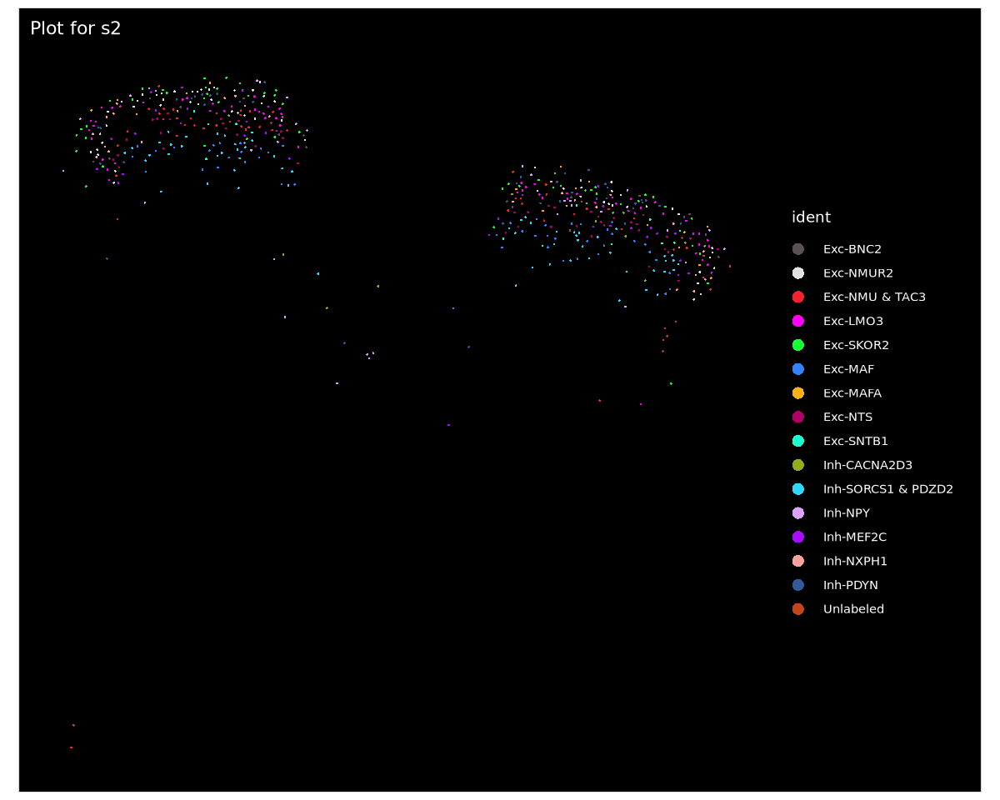

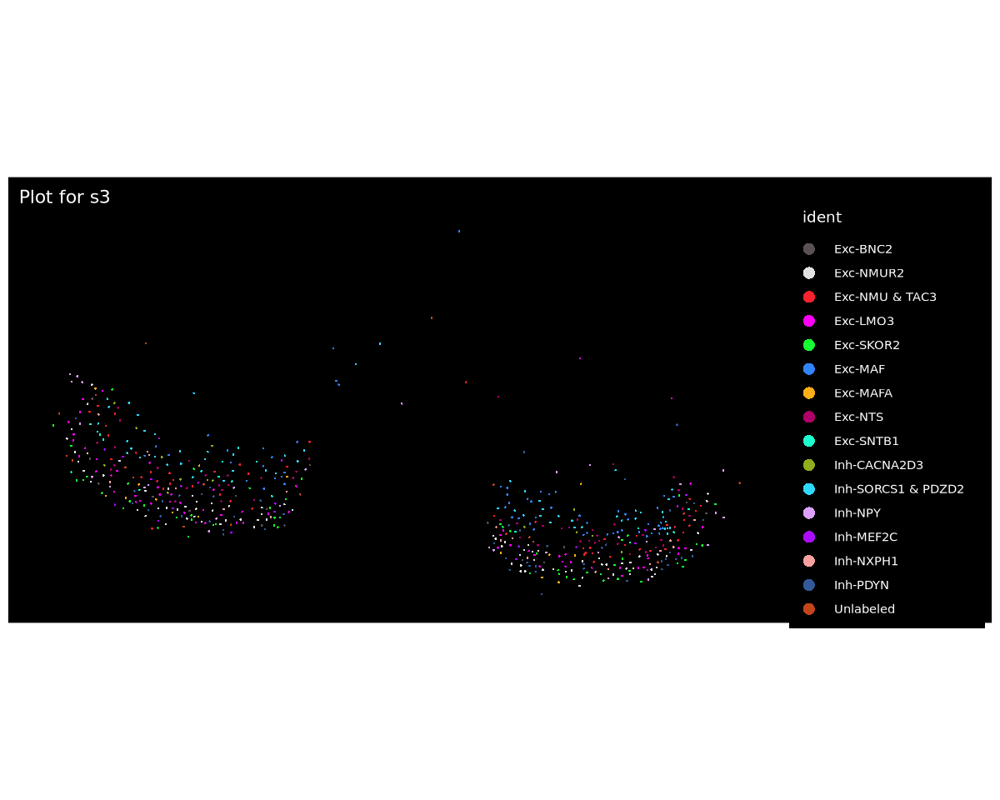

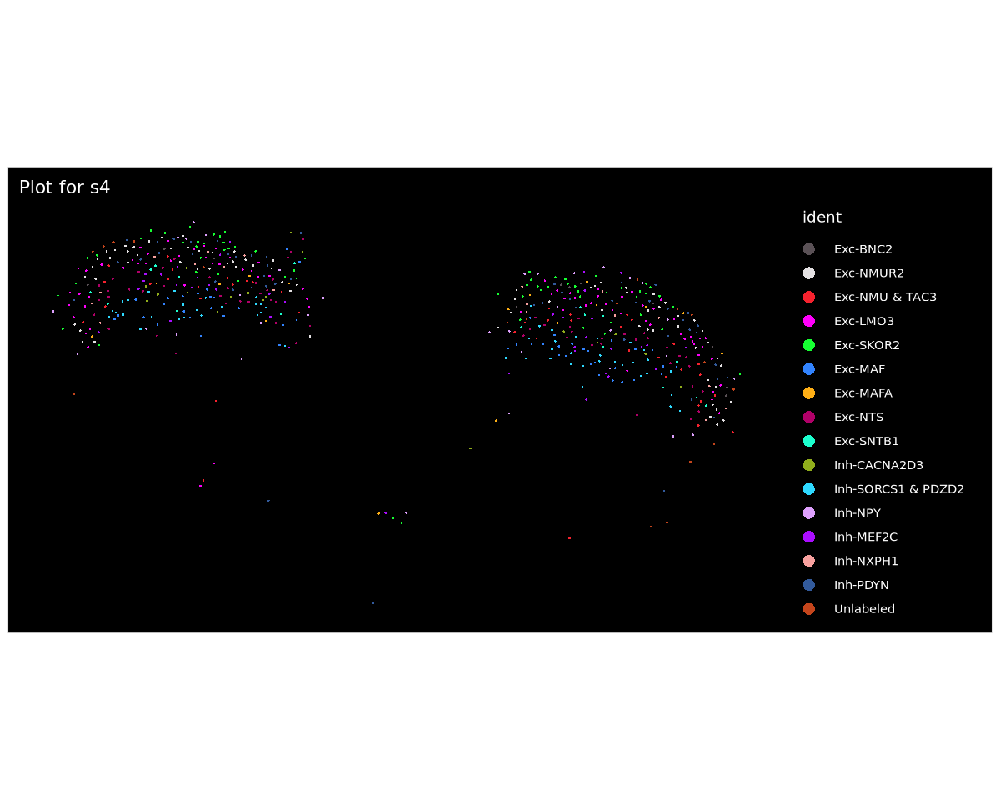

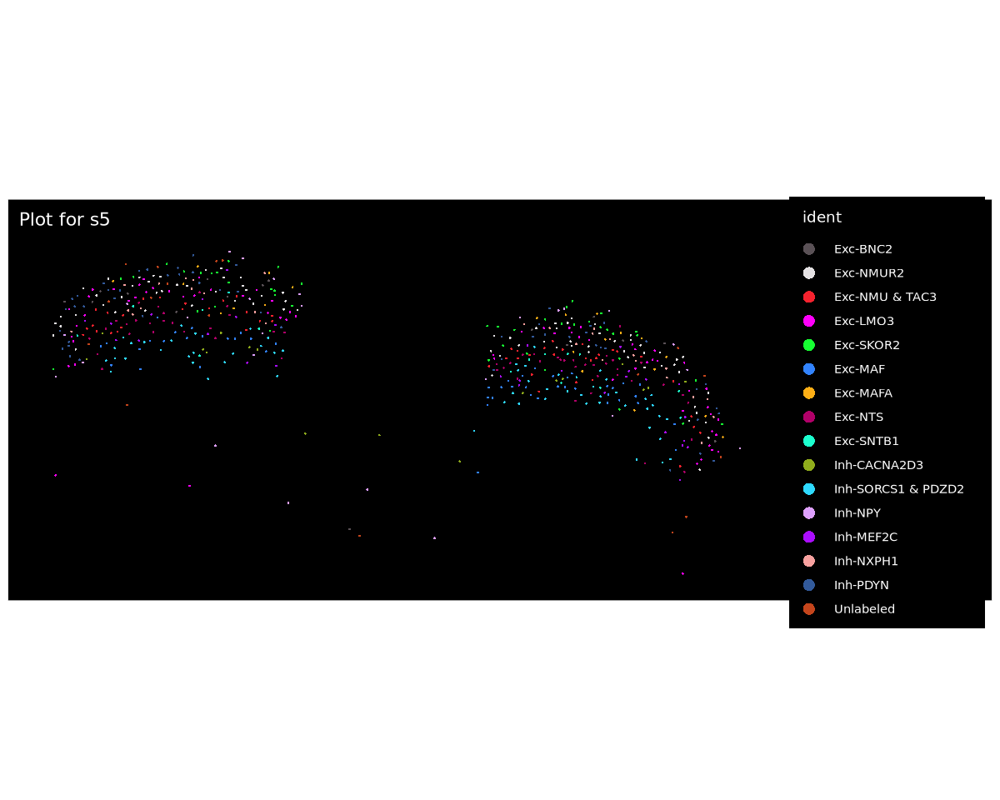

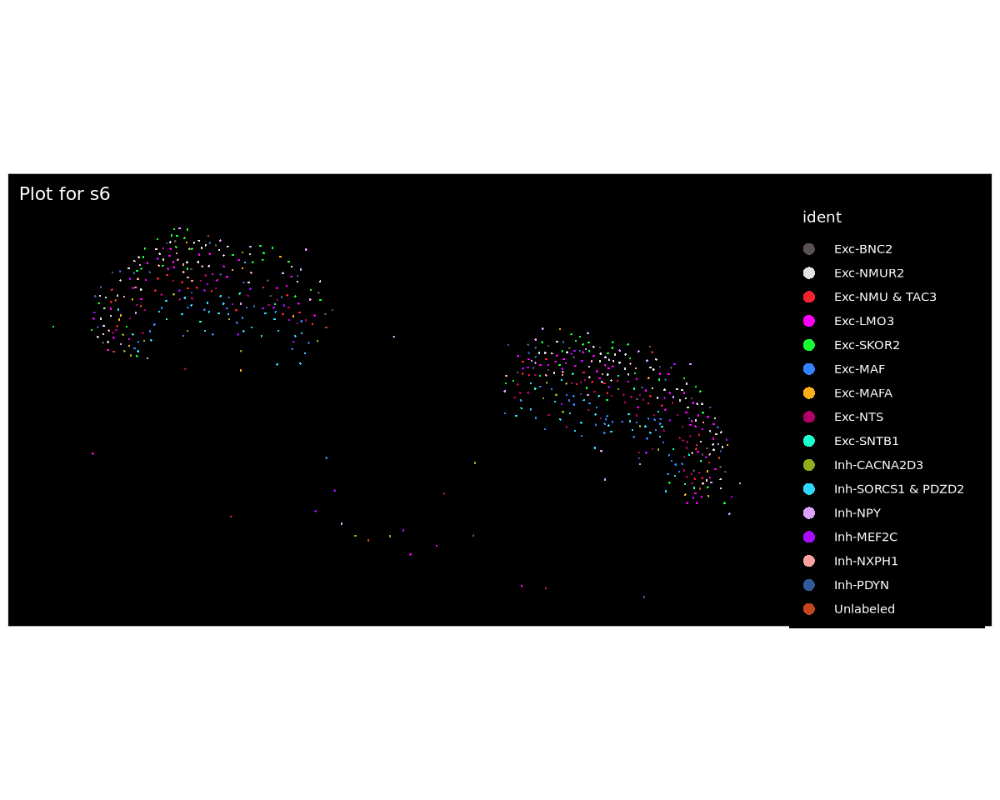

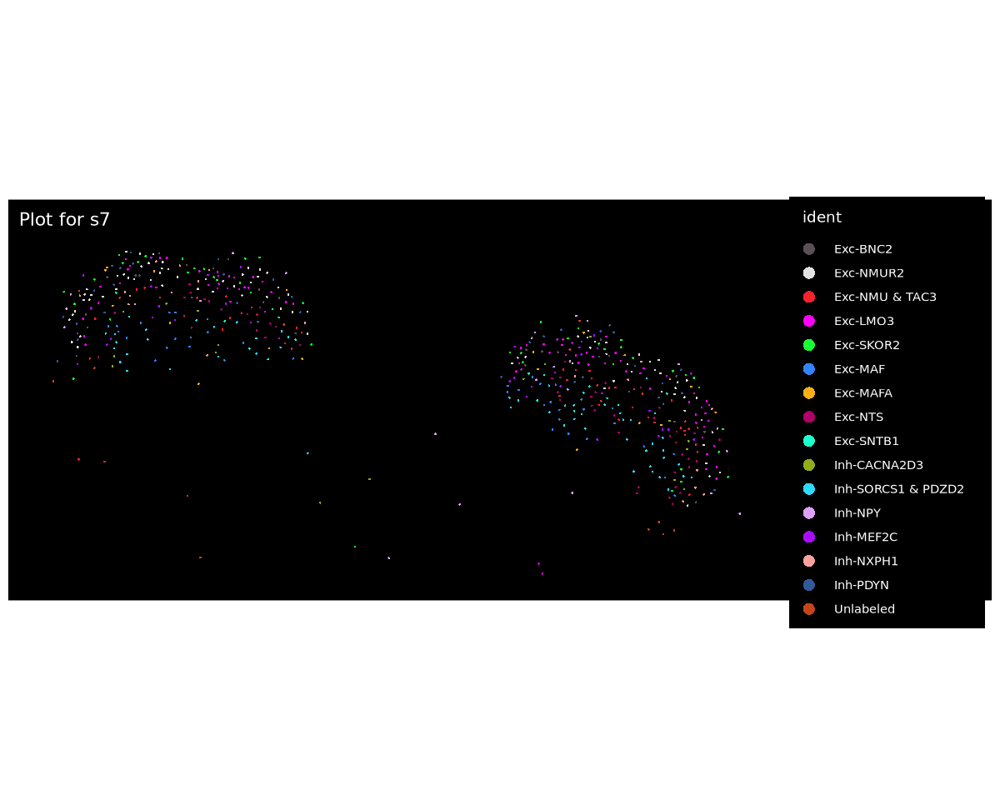

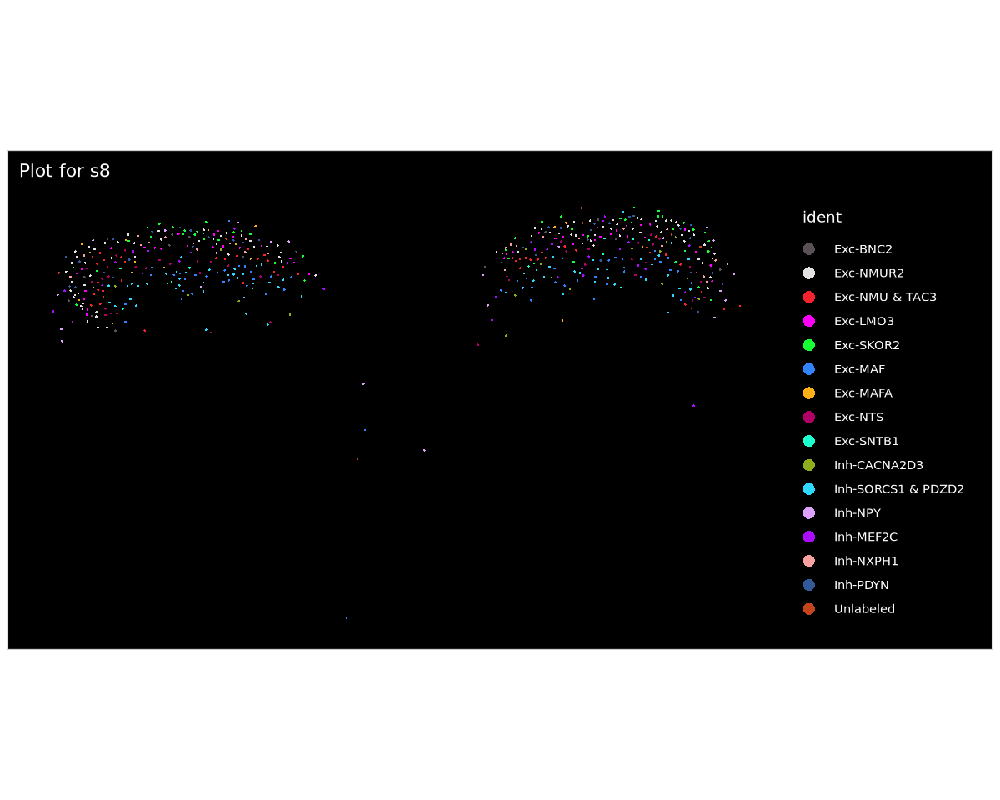

In [55]:
fovs = c("s1", "s2", "s3", "s4", "s5", "s6", "s7", "s8")
for (fov in fovs){
    p = ImageDimPlot(xenium.dh, fov = fov, cols = "polychrome", size = 0.75, alpha = 1.2)
    p <- p + ggtitle(paste("Plot for", fov))
    print(p)
    # print("hello")
}

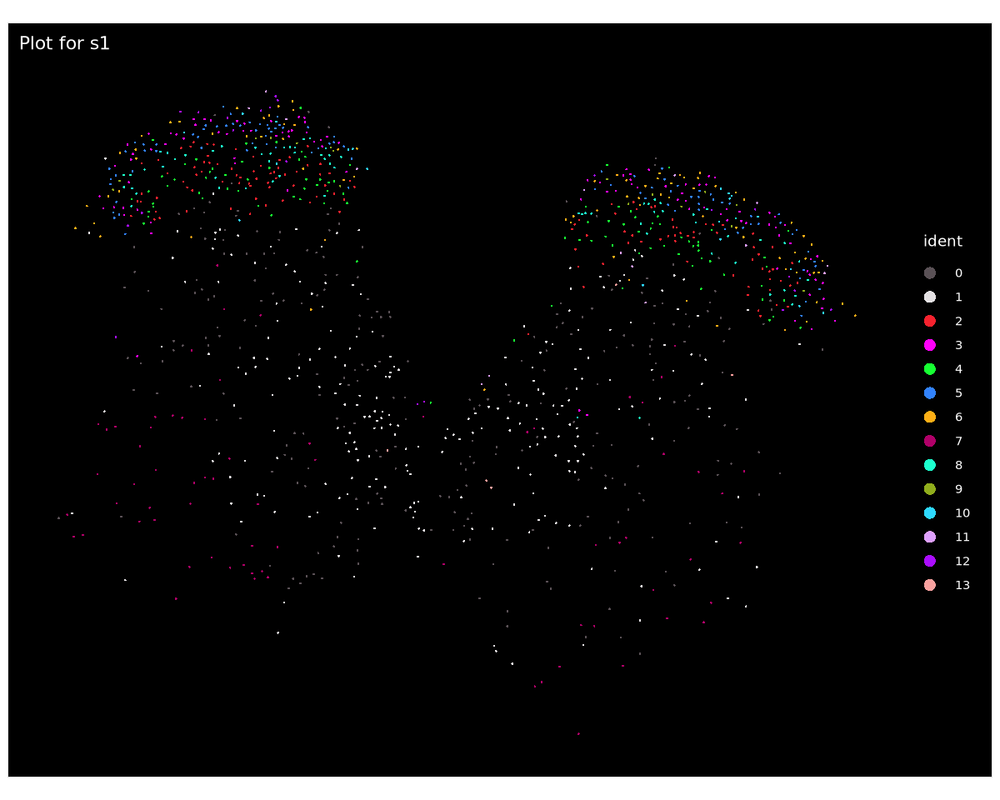

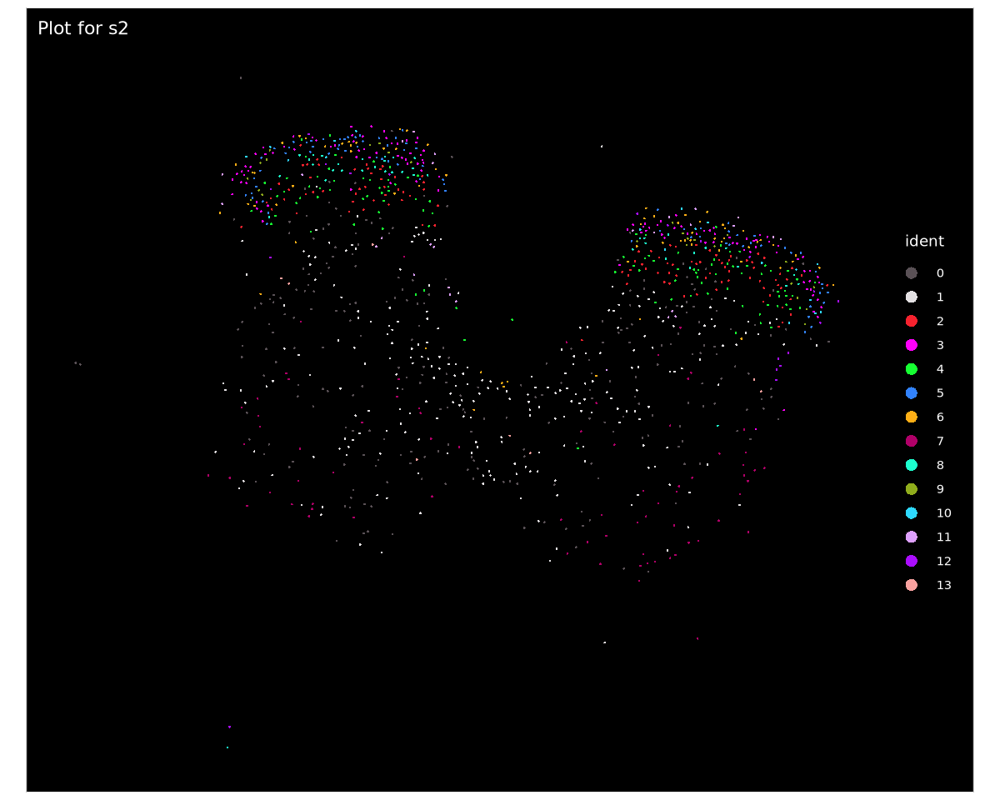

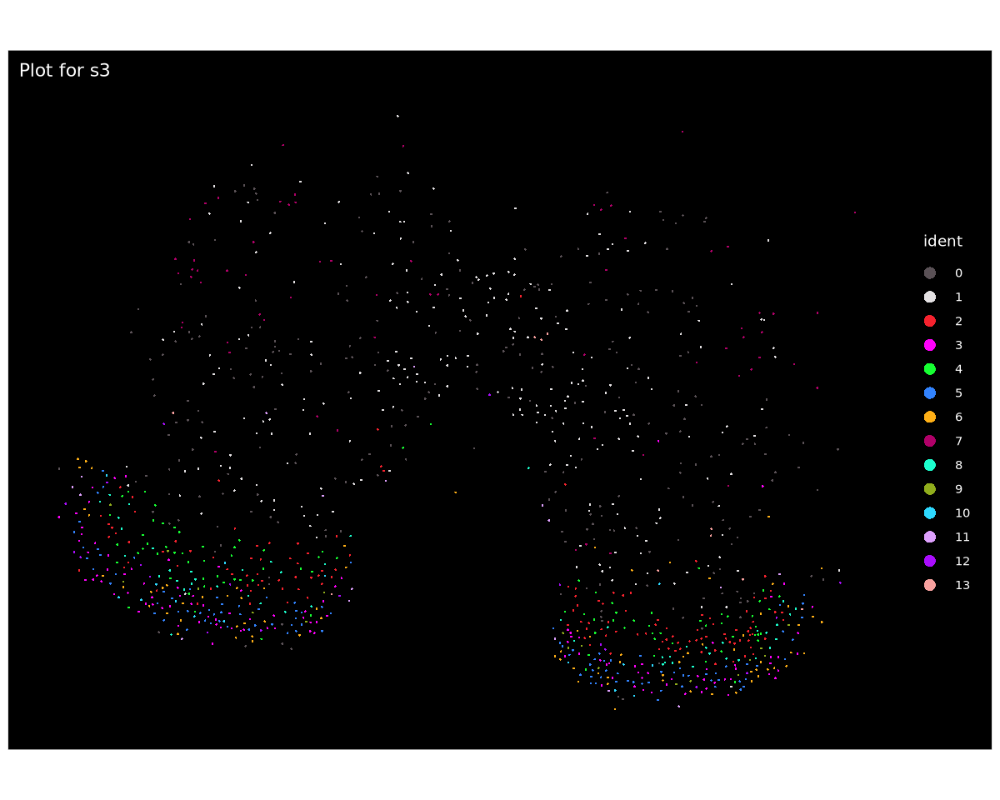

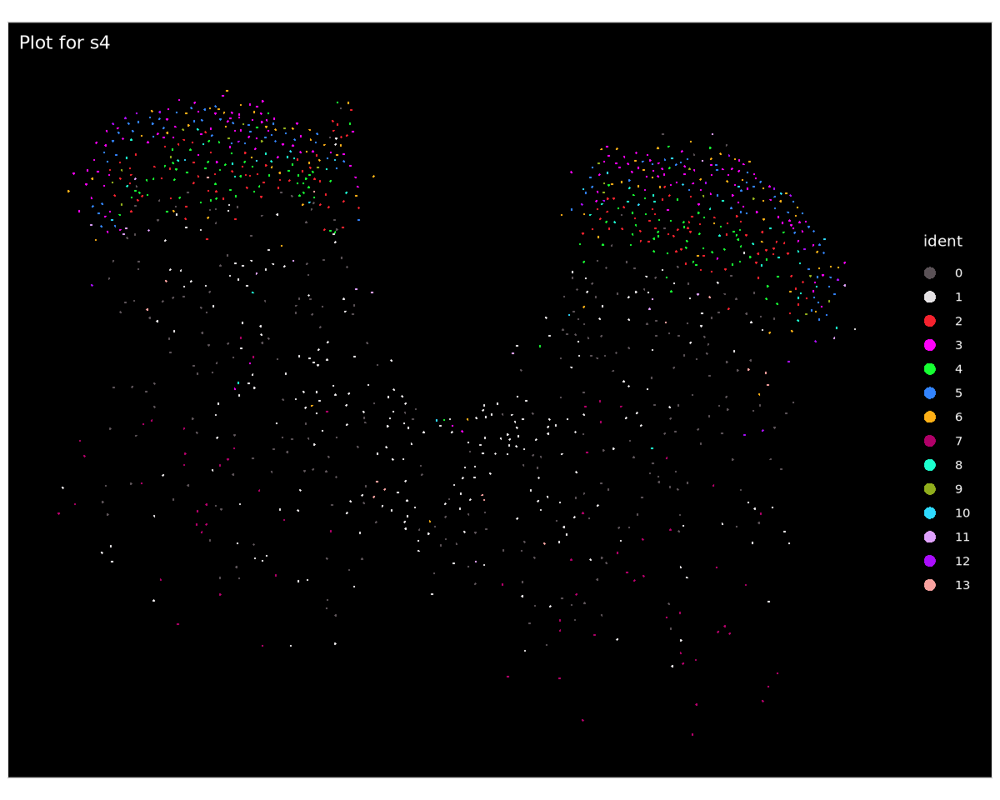

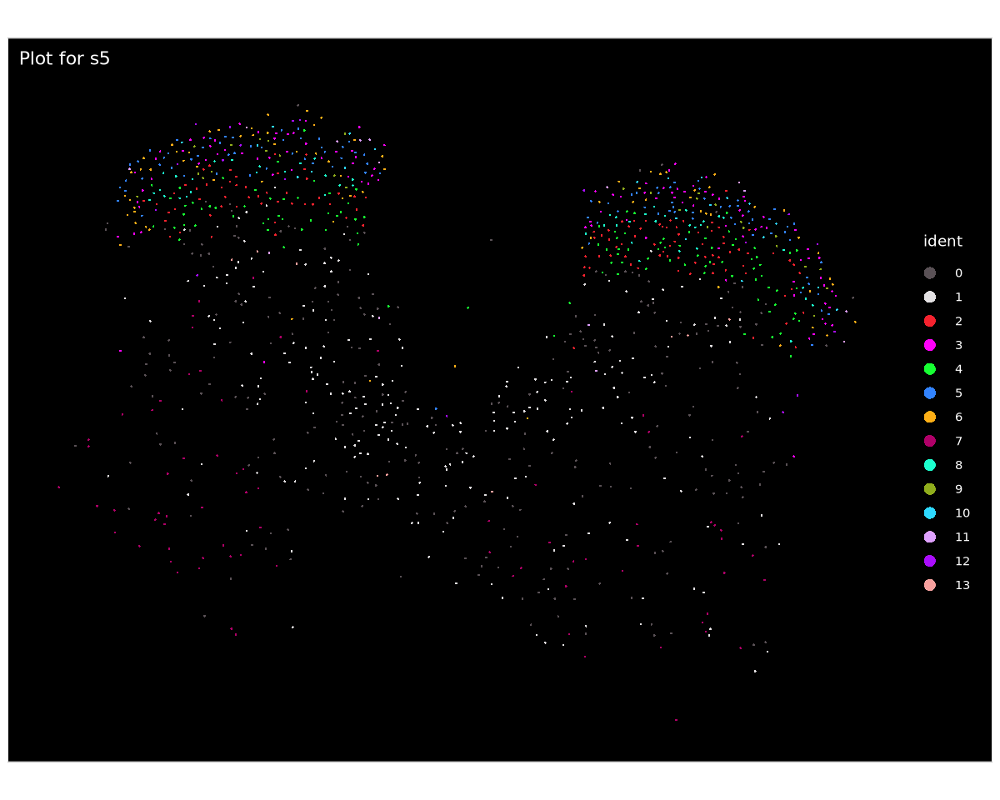

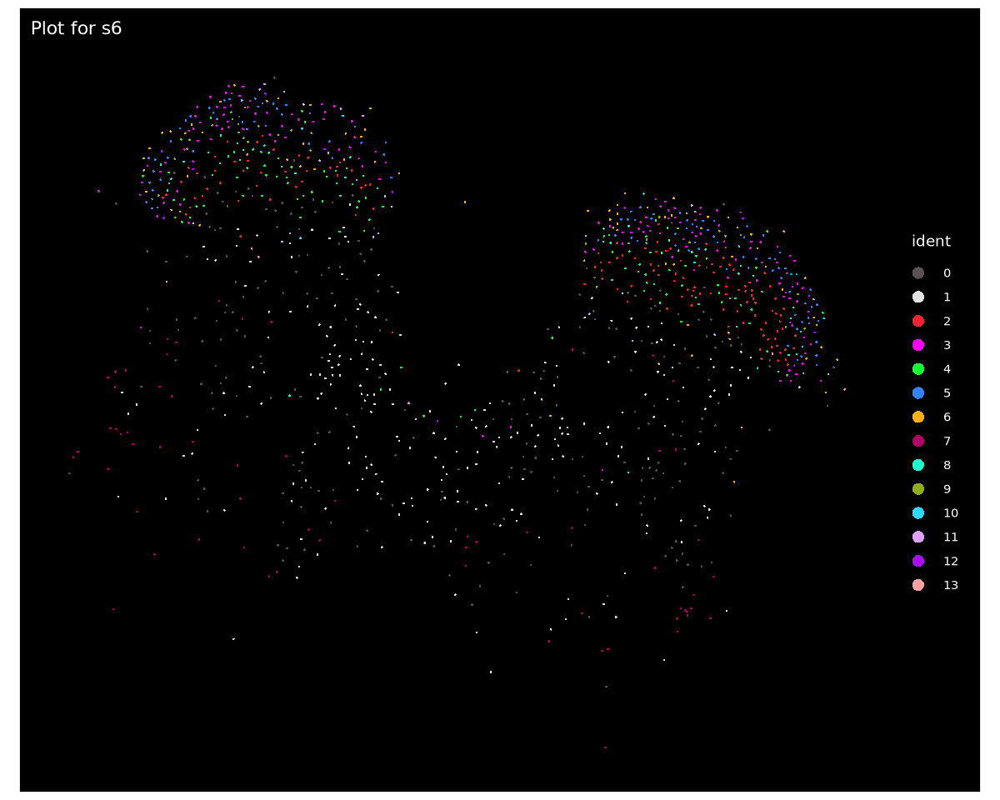

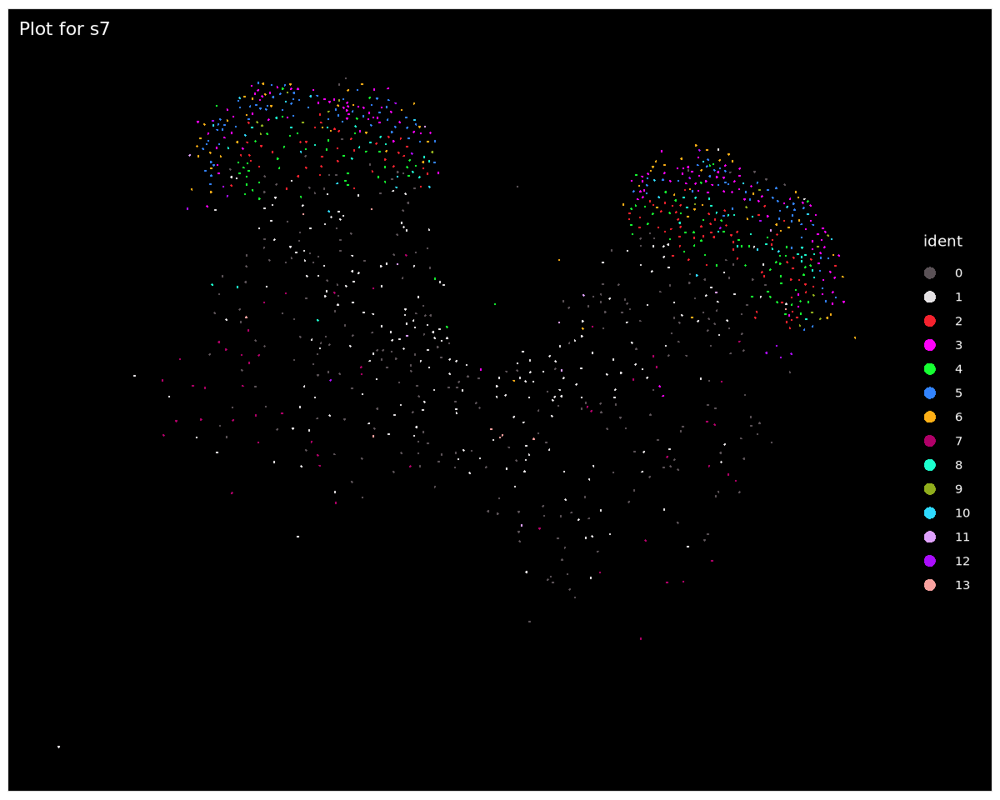

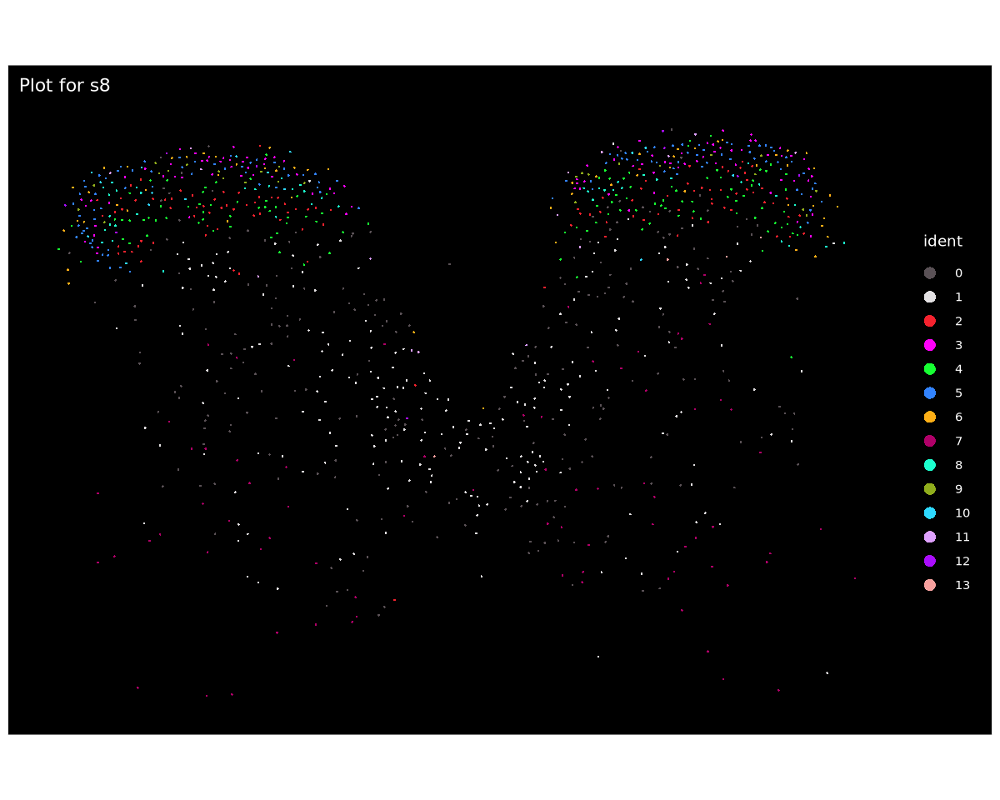

In [50]:
fovs = c("s1", "s2", "s3", "s4", "s5", "s6", "s7", "s8")
for (fov in fovs){
    p = ImageDimPlot(xenium.neurons, fov = fov, cols = "polychrome", size = 0.75, alpha = 1.2)
    p <- p + ggtitle(paste("Plot for", fov))
    print(p)
    # print("hello")
}

In [56]:
# left and right dorsal horns

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(4250, 5000), x = c(1500, 2500), coords = "plot")
xenium.dh[["s1_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s1_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(4250, 5000), x = c(500, 1500), coords = "plot")
xenium.dh[["s1_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s1_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(4000, 5000), x = c(4800, 6000), coords = "plot")
xenium.dh[["s2_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s2_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(4400, 5300), x = c(3600, 4700), coords = "plot")
xenium.dh[["s2_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s2_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(3800, 4700), x = c(7000, 8000), coords = "plot")
xenium.dh[["s3_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s3_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(3500, 4700), x = c(8000, 9500), coords = "plot")
xenium.dh[["s3_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s3_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2300), x = c(5400, 7000), coords = "plot")
xenium.dh[["s4_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s4_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2300), x = c(4000, 5200), coords = "plot")
xenium.dh[["s4_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s4_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2300), x = c(7500, 8800), coords = "plot")
xenium.dh[["s5_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s5_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2300), x = c(8800, 10000), coords = "plot")
xenium.dh[["s5_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s5_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2300), x = c(12800, 14000), coords = "plot")
xenium.dh[["s6_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s6_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2500), x = c(11500, 12800), coords = "plot")
xenium.dh[["s6_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s6_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2500), x = c(16500, 17500), coords = "plot")
xenium.dh[["s7_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s7_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(1400, 2500), x = c(15500, 16400), coords = "plot")
xenium.dh[["s7_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s7_left"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(2400, 3200), x = c(19900, 21000), coords = "plot")
xenium.dh[["s8_right"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s8_right"]]) <- "segmentation"

cropped.coords <- Crop(xenium.dh[["fov"]], y = c(2400, 3200), x = c(18500, 19700), coords = "plot")
xenium.dh[["s8_left"]] <- cropped.coords
DefaultBoundary(xenium.dh[["s8_left"]]) <- "segmentation"


Warning message:
“Key ‘Xenium_’ taken, using ‘s1right_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s1left_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s2right_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s2left_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s3right_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s3left_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s4right_’ instead”
Warning message:
“Adding image with unordered cells”
Warning message:
“Key ‘Xenium_’ taken, using ‘s4left_’ instead”
Warning message:
“Adding image with unordered cells”
Warning message:
“Key ‘Xenium_’ taken, using ‘s5left_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s5right_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s6right_’ instead”
Warning message:
“Adding image with unordered cells”
Warning message:
“Key ‘Xenium_’ taken, using ‘s6left_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s7right_’ instead”
Wa

In [57]:
xenium.centroids <- ReadXenium(data.dir = saline_data, type = "centroids")


10X data contains more than one type and is being returned as a list containing matrices of each type.



In [58]:
head(xenium.centroids[[2]])

,x,y,gene
,<dbl>,<dbl>,<chr>
1,27.98757,3701.847,DeprecatedCodeword_0334
2,111.53512,3636.894,Bhlhe40
3,142.83273,3728.973,Bhlhe40
4,148.26701,3734.854,DeprecatedCodeword_0334
5,154.01965,3706.970,DeprecatedCodeword_0334
6,182.90828,3654.527,DeprecatedCodeword_0334


In [76]:
# get centroids of all xenium cells
xenium.centroids <- ReadXenium(data.dir = saline_data, type = "centroids")
rownames(xenium.centroids$centroids) <- xenium.centroids$cell
xenium.centroids$centroids %>% head()

# get labels for dh xenium
xenium.dh_labels = xenium.dh[[]][c('tentative_labels')]
xenium.dh_labels$cell = rownames(xenium.dh_labels)
head(xenium.dh_labels)

# merge to get coordinates for labeled cells
xenium.dh_centroids_labels = merge(x = xenium.dh_labels, y = xenium.centroids$centroids, by = "cell", all.x = TRUE)
head(xenium.dh_centroids_labels)

10X data contains more than one type and is being returned as a list containing matrices of each type.



In [227]:
# merge to get coordinates for labeled cells
table(xenium.dh_centroids_labels$tentative_labels)


          Exc-BNC2           Exc-LMO3            Exc-MAF           Exc-MAFA 
               135                521                408                142 
    Exc-NMU & TAC3          Exc-NMUR2            Exc-NTS          Exc-SKOR2 
               371                611                403                404 
         Exc-SNTB1       Inh-CACNA2D3          Inh-MEF2C            Inh-NPY 
               129                142                237                237 
         Inh-NXPH1           Inh-PDYN Inh-SORCS1 & PDZD2            Unknown 
               174                354                438                126 

In [273]:
# ordered cell types
ordered_dh_cells = c('Exc-BNC2','Exc-NMUR2', 'Exc-NMU & TAC3','Exc-LMO3', 'Exc-SKOR2', 'Exc-MAF', 'Exc-MAFA', 
                  'Exc-NTS', 'Exc-SNTB1', 'Exc-PBX3', 
                  'Inh-CACNA2D3', 'Inh-SORCS1 & PDZD2', 'Inh-NPY', 'Inh-MEF2C','Inh-NXPH1','Inh-PDYN')
#### order the cells
# remove Unknown
xenium.dh_centroids_labels = xenium.dh_centroids_labels[xenium.dh_centroids_labels$tentative_labels != 'Unknown',]
xenium.dh_centroids_labels$tentative_labels = factor(xenium.dh_centroids_labels$tentative_labels, levels=ordered_dh_cells)

# slice column to fill
xenium.dh_centroids_labels$slice <- NULL
# x deviation for plotting later
xenium.dh_centroids_labels$x_dex <- NULL
xenium.dh_centroids_labels$x_above_mean <- NULL

slices = c("s1_right", "s1_left", "s2_right", "s2_left", "s3_right", "s3_left", "s4_right", "s4_left",
           "s5_right", "s5_left", "s6_right", "s6_left", "s7_right", "s7_left", "s8_right", "s8_left")

updown = c(1,  1, 1, 1,                # 1 means dorsalhorn is up, -1 means down
          -1, -1, 1, 1,                # section three is the only down
           1,  1, 1, 1,
           1,  1, 1, 1)
names(updown) = slices

for (s in slices){
    
    slice_cells = Cells(xenium.dh[[s]])
    xenium.dh_centroids_labels$slice[xenium.dh_centroids_labels$cell %in% slice_cells] = s
}

table(xenium.dh_centroids_labels$slice)

### remove the very small number of NA slice cells
xenium.dh_centroids_labels = xenium.dh_centroids_labels[!is.na(xenium.dh_centroids_labels$slice),]

# average y coords per slice
for (s in slices){

    # get average y value
    orig_x = as.numeric(xenium.dh_centroids_labels$x[xenium.dh_centroids_labels$slice == s])

    mean_x = mean(orig_x)
    std_x = sqrt(var(orig_x))
    direction = as.numeric(updown[s])
                  
    # make x deviations
    xenium.dh_centroids_labels$x_dev[xenium.dh_centroids_labels$slice == s] = (orig_x - mean_x)*direction/std_x# - median_y)*direction/std_y
    xenium.dh_centroids_labels$x_above_mean[xenium.dh_centroids_labels$slice == s] = orig_x > mean_x
}

# flip all values so that depth is up
#xenium.dh_centroids_labels$x_dev = -1 * as.numeric(xenium.dh_centroids_labels$x_dev)


 s1_left s1_right  s2_left s2_right  s3_left s3_right  s4_left s4_right 
     302      291      270      277      304      287      302      307 
 s5_left s5_right  s6_left s6_right  s7_left s7_right  s8_left s8_right 
     276      324      267      346      265      310      287      279 

Warning message:
“Removed 130 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 130 rows containing non-finite values (`stat_boxplot()`).”


png 
  2

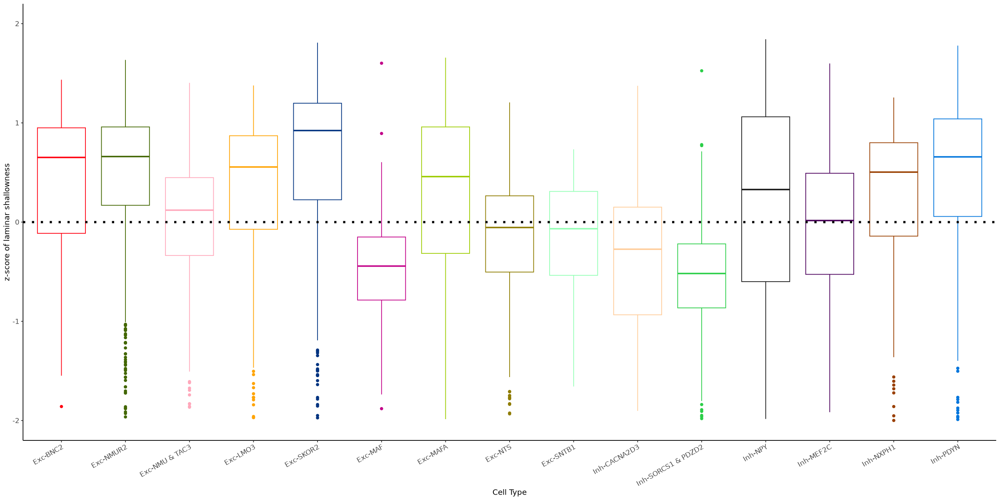

In [289]:
options(repr.plot.width=20, repr.plot.height=10)
library(ggplot2)


colors= rev(c('#0075DC','#993F00','#4C005C','#191919'       ,'#2BCE48','#FFCC99'       ,'#94FFB5','#8F7C00','#9DCC00',
         '#C20088','#003380','#FFA405'      ,'#FFA8BB','#426600','#FF0010'))

# Basic box plot
p <- ggplot(xenium.dh_centroids_labels, aes(x=tentative_labels, y=x_dev)) + 
  geom_boxplot(color=colors) + geom_hline(yintercept=0, linetype='dotted', col = 'black', size = 1.5) +
  ylim(-2, 2) +
  xlab("Cell Type") + ylab("z-score of laminar shallowness") +
  theme(axis.text.x = element_text(size = 10, angle = 30, vjust = 1, hjust=1), axis.text.y = element_text(size = 10),
          axis.title.y = element_text(size = 11), axis.title.x = element_text(size = 11), 
          panel.border = element_blank(),
          panel.background = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          # Change axis line
          axis.line = element_line(colour = "black") )

  #geom_boxplot()
print(p)


pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/laminar_distros_",Sys.Date(),".pdf")), width=7.5, height=5)
print(p)
dev.off()

#for (s in slices){
# p <- ggplot(xenium.dh_centroids_labels[xenium.dh_centroids_labels$slice == 's1_left',], aes(x=tentative_labels, y=y)) + 
#     geom_point() + geom_jitter()
# print(p)
#}

In [312]:
### make slicewise avgs
no_pbx3 = c('Exc-BNC2','Exc-NMUR2', 'Exc-NMU & TAC3','Exc-LMO3', 'Exc-SKOR2', 'Exc-MAF', 'Exc-MAFA', 
                  'Exc-NTS', 'Exc-SNTB1',
                  'Inh-CACNA2D3', 'Inh-SORCS1 & PDZD2', 'Inh-NPY', 'Inh-MEF2C','Inh-NXPH1','Inh-PDYN')


aggregated_positions = aggregate(as.numeric(xenium.dh_centroids_labels$x_dev),
          list(slice = xenium.dh_centroids_labels$slice,
               tentative_labels = xenium.dh_centroids_labels$tentative_labels),
          mean)

unadjusted_p = lapply(no_pbx3, function(celltype){

    celltype_subset = xenium.dh_centroids_labels[xenium.dh_centroids_labels$tentative_labels == celltype,]
    return(wilcox.test(celltype_subset$x_dev)$p.value)
} )

#unadjusted_p
adjusted_p = p.adjust(unadjusted_p)
names(adjusted_p) = no_pbx3 
print(adjusted_p)

# for (celltype in ordered_dh_cells){
#     if (celltype != 'Exc-PBX3'){
#     celltype_subset = xenium.dh_centroids_labels[xenium.dh_centroids_labels$tentative_labels == celltype,]
#     print(celltype)
#     print(wilcox.test(celltype_subset$x_dev)$p.value)
#     print('')

#         }
# }

          Exc-BNC2          Exc-NMUR2     Exc-NMU & TAC3           Exc-LMO3 
      6.770539e-05       4.541182e-32       1.000000e+00       8.179867e-13 
         Exc-SKOR2            Exc-MAF           Exc-MAFA            Exc-NTS 
      2.643182e-28       1.531490e-52       4.879712e-02       8.941903e-05 
         Exc-SNTB1       Inh-CACNA2D3 Inh-SORCS1 & PDZD2            Inh-NPY 
      9.039826e-02       9.623501e-08       2.621790e-58       1.000000e+00 
         Inh-MEF2C          Inh-NXPH1           Inh-PDYN 
      9.094046e-01       1.649652e-06       1.907384e-15 


Warning message:
“Removed 3 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 3 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”


png 
  2

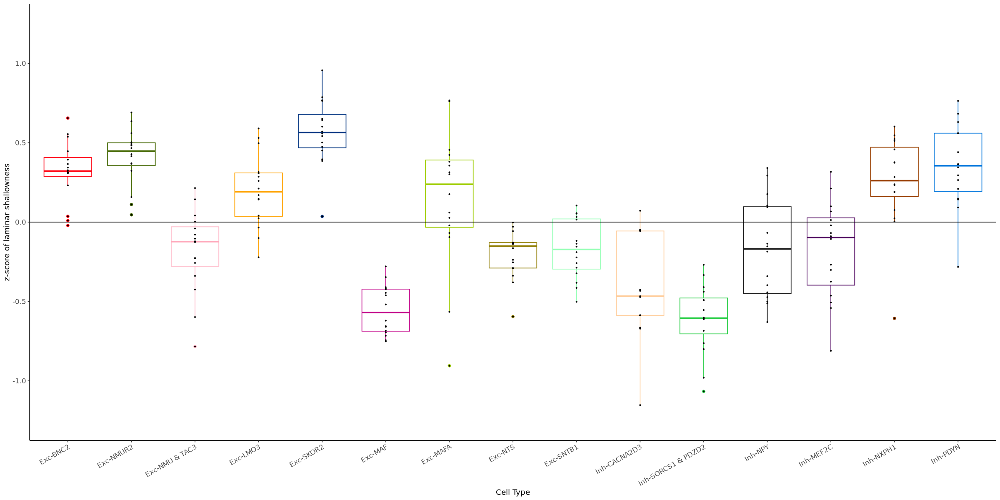

In [302]:
###### do it by slice
options(repr.plot.width=20, repr.plot.height=10)
library(ggplot2)


colors= rev(c('#0075DC','#993F00','#4C005C','#191919'       ,'#2BCE48','#FFCC99'       ,'#94FFB5','#8F7C00','#9DCC00',
         '#C20088','#003380','#FFA405'      ,'#FFA8BB','#426600','#FF0010'))

# Basic box plot
p <- ggplot(aggregated_positions, aes(x=tentative_labels, y=x)) + 
  geom_boxplot(color=colors) + geom_hline(yintercept=0, linetype='solid', col = 'black', size = 0.5) + geom_point(size=0.5) +
  ylim(-1.25, 1.25) +
  xlab("Cell Type") + ylab("z-score of laminar shallowness") +
  theme(axis.text.x = element_text(size = 10, angle = 30, vjust = 1, hjust=1), axis.text.y = element_text(size = 10),
          axis.title.y = element_text(size = 11), axis.title.x = element_text(size = 11), 
          panel.border = element_blank(),
          panel.background = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          # Change axis line
          axis.line = element_line(colour = "black") )

  #geom_boxplot()
print(p)


pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/aggregate_distros_",Sys.Date(),".pdf")), width=7.5, height=4)
print(p)
dev.off()

In [60]:
cropped.coords <- Crop(xenium.dh[["fov"]], y = c(4500, 5000), x = c(1800, 2500), coords = "plot")
xenium.dh[["figxample"]] <- cropped.coords
DefaultBoundary(xenium.dh[["figxample"]]) <- "centroids"

cropped.coords <- Crop(xenium.obj[["fov"]], y = c(3100, 5000), x = c(100, 3000), coords = "plot")
xenium.obj[["s1"]] <- cropped.coords

Warning message:
“Key ‘Xenium_’ taken, using ‘figxample_’ instead”
Warning message:
“Key ‘Xenium_’ taken, using ‘s1_’ instead”


png 
  2

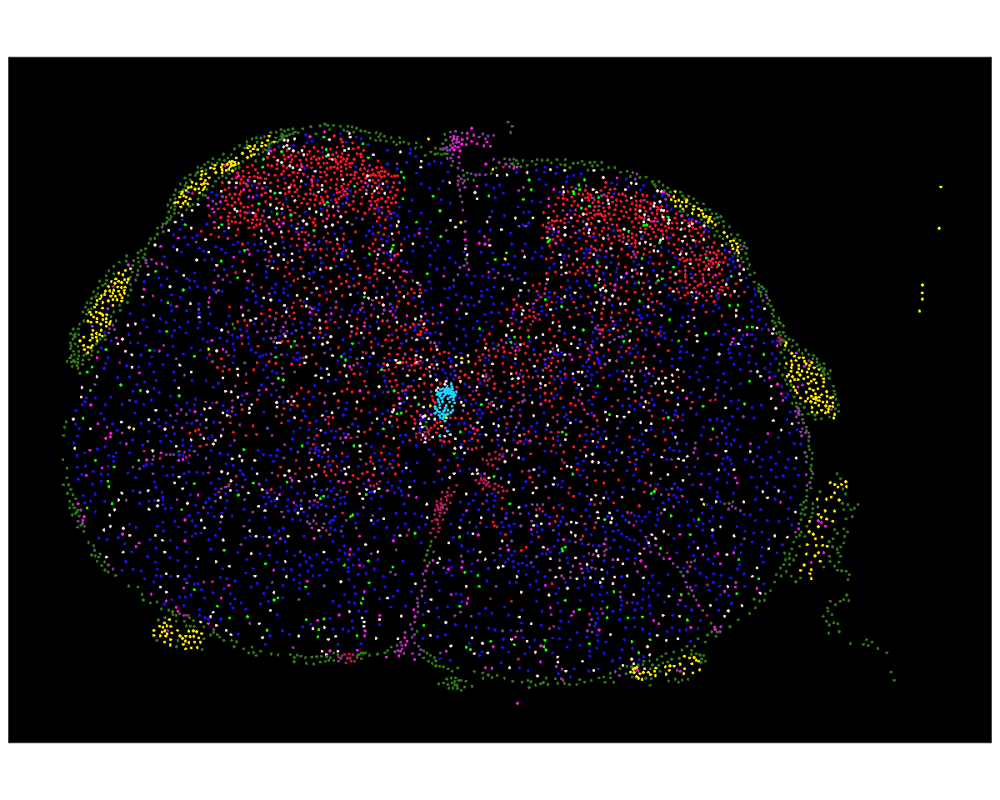

png 
  2

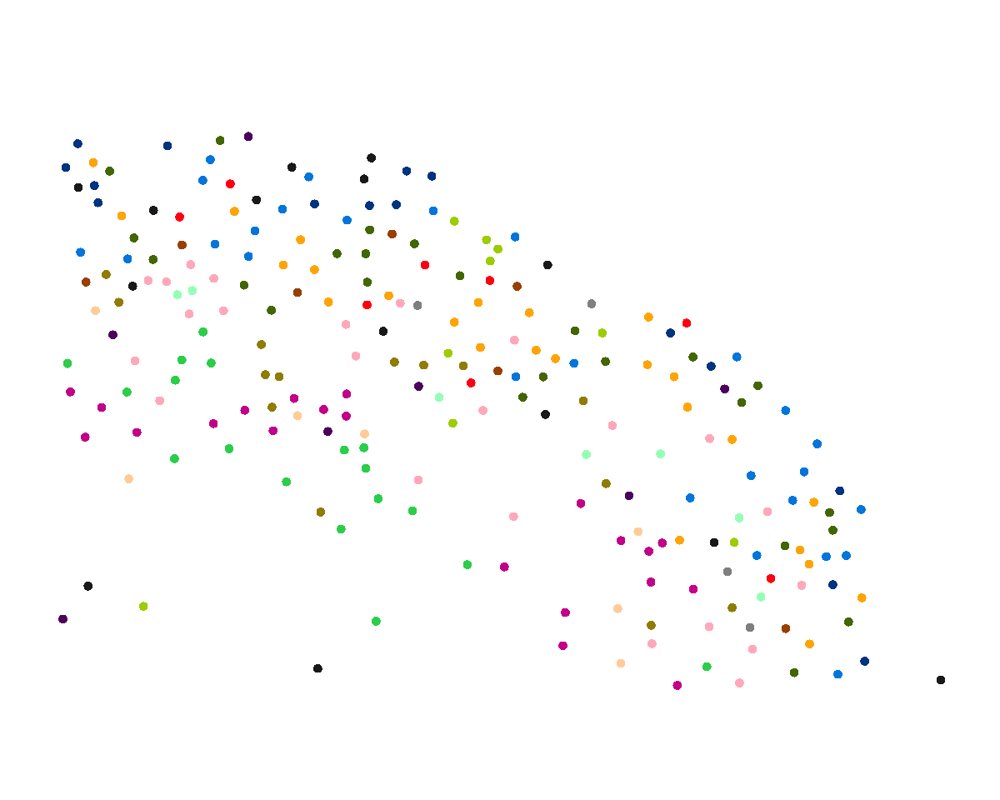

In [62]:

fov = 's1'
p = ImageDimPlot(xenium.obj, fov = fov, cols = colors_neurons_glia, size = 1, alpha = 1, group.by = 'tentative_labels', border.size = NA)
p <- p + ggtitle('') + labs(fill='Cell Classes') + theme(legend.position = 'none') + NoGrid()
print(p)


pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/all_cells_labeled_s1_",Sys.Date(),".pdf")), width=4, height=4)
print(p)
dev.off()


fov = 'figxample'
p = ImageDimPlot(xenium.dh, fov = fov,  size = 3, alpha = 1, cols = rev(c('grey50',colors_new_labels)), border.size = NA, 
                 dark.background = FALSE) +
    theme(legend.position = 'none')
p <- p + ggtitle('') + NoGrid()
print(p)

pdf(here(paste0("figures/exploratory/arokiaraj_paper/xen/dh_cells_s1_right_",Sys.Date(),".pdf")), width=3, height=2)
print(p)
dev.off()


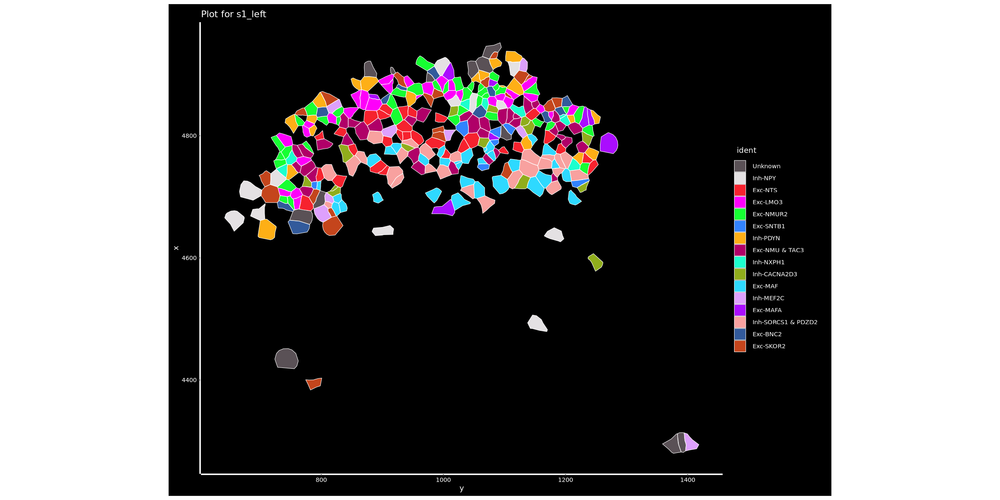

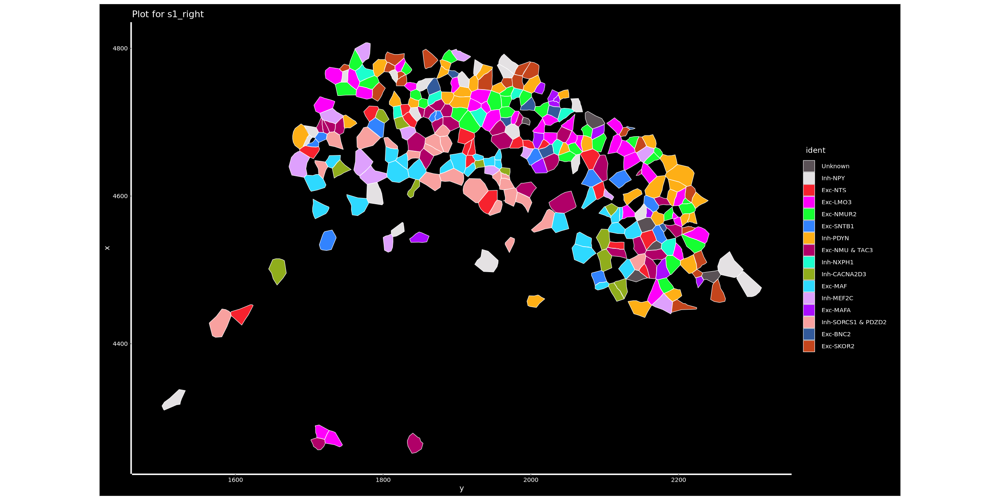

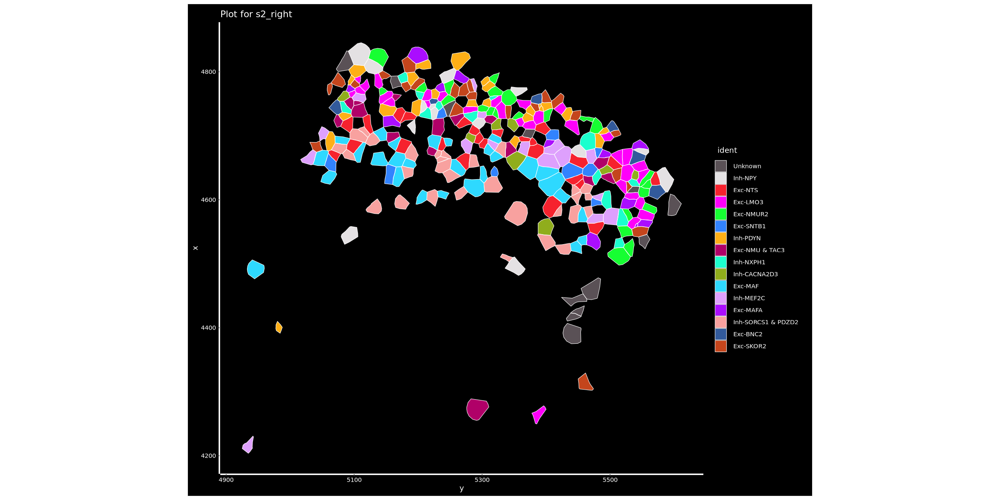

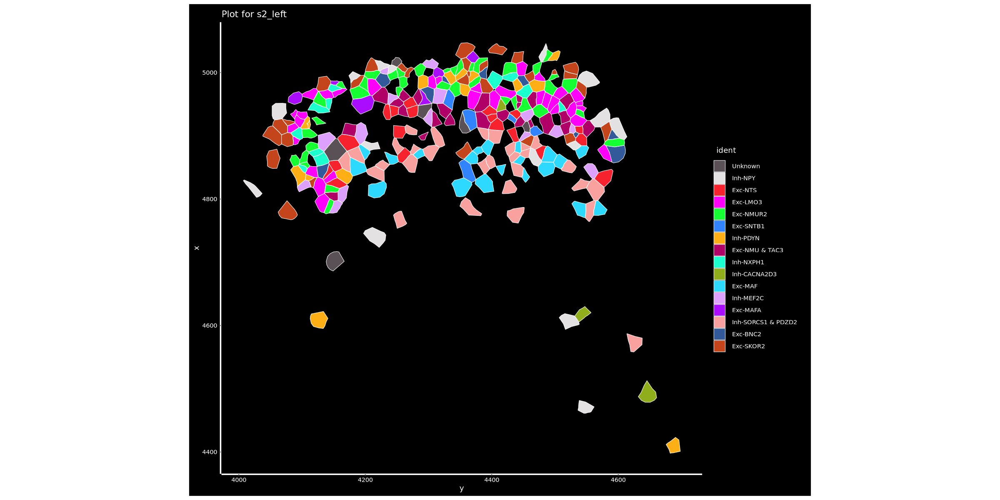

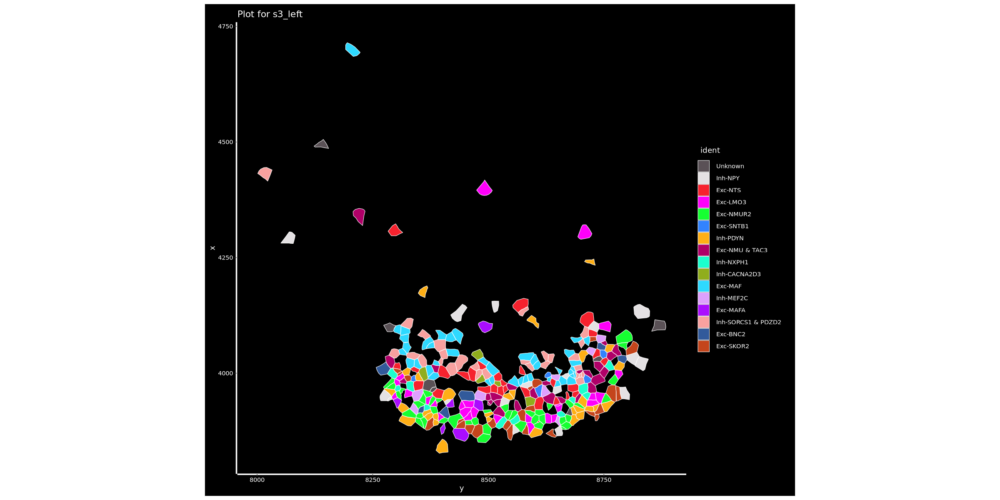

...

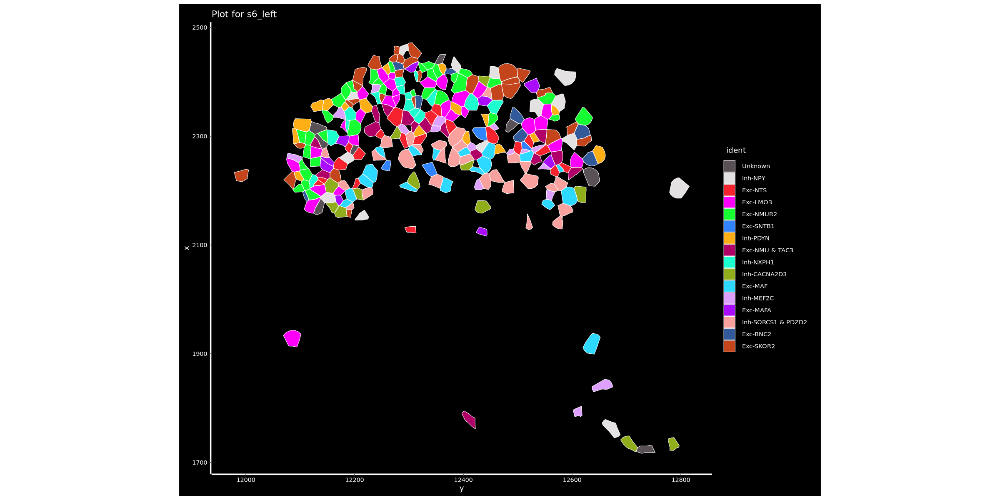

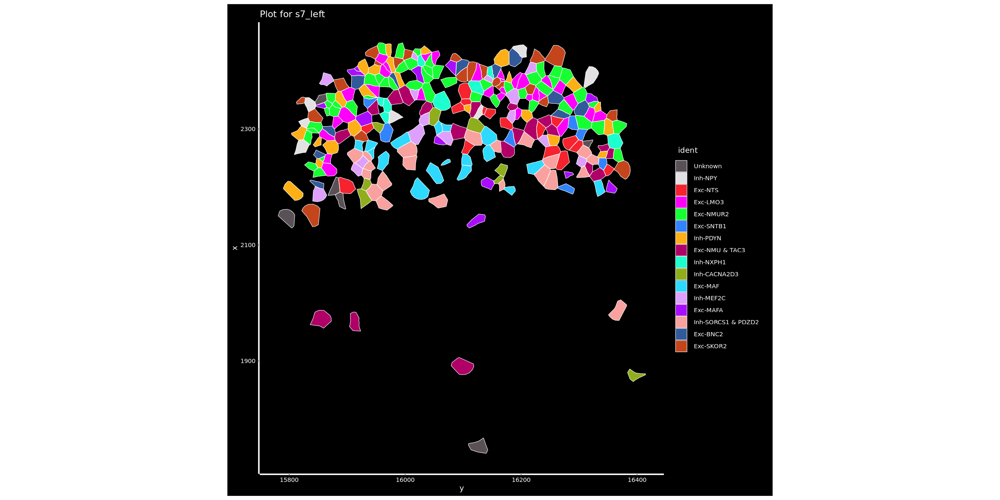

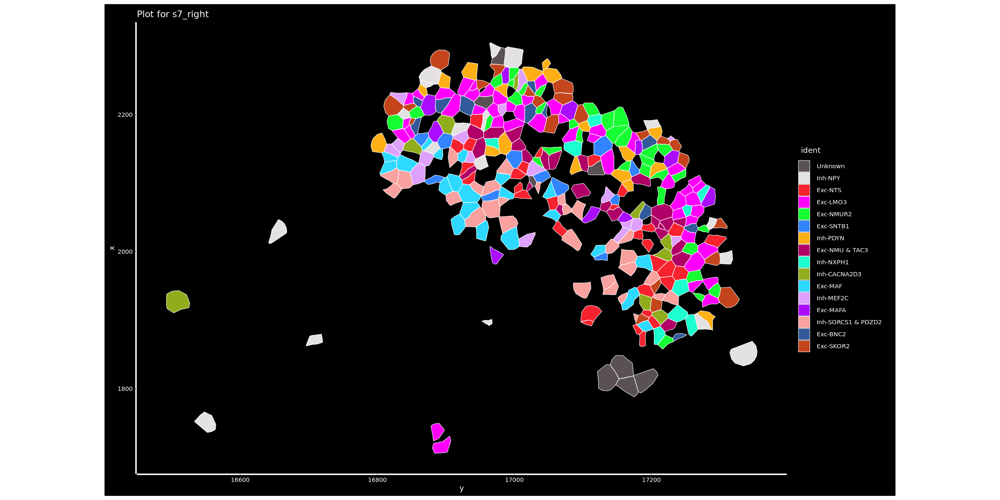

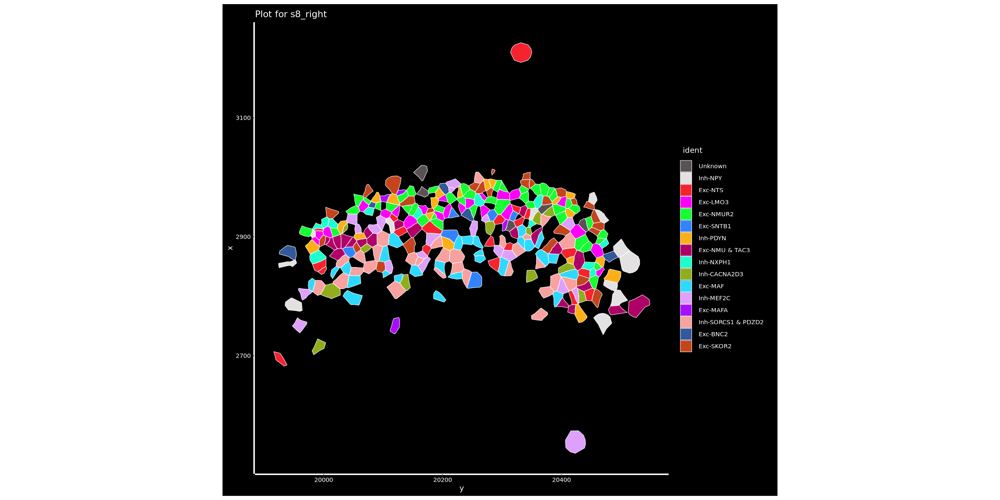

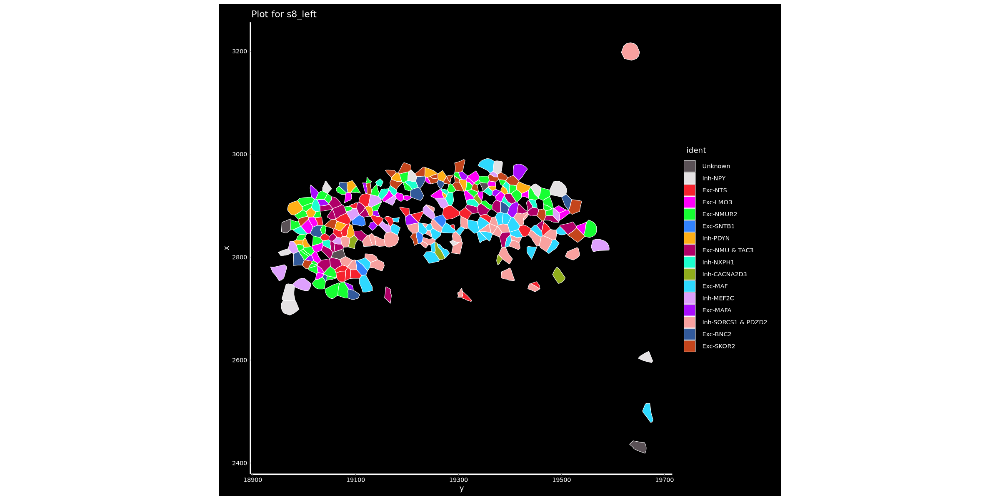

In [210]:
fovs = c("s1_left", "s1_right", "s2_right", "s2_left",
         "s3_left", "s3_right", "s4_right", "s4_left",
         "s5_left", "s5_right", "s6_right", "s6_left",
         "s7_left", "s7_right", "s8_right", "s8_left")


for (fov in fovs){
    p = ImageDimPlot(xenium.dh, fov = fov, cols = "polychrome", size = 0.75, alpha = 1.2, axes = TRUE)
    p <- p + ggtitle(paste("Plot for", fov))
    print(p)
    # print("hello")
}

In [60]:
# options(repr.plot.width=15, repr.plot.height=10)
# fovs = c("s1_left", "s1_right", "s2_right")
# for (fov in fovs){
#     q = ImageDimPlot(xenium.dh, fov = fov, cols = "polychrome", size = 0.75, alpha = 1.2)
#     q <- q + ggtitle(paste("FCell type Plot for", fov))
#     p = ImageFeaturePlot(xenium.dh, fov = fov, features = c("Pdyn"), size = 0.75)
#     p <- p + ggtitle(paste("Feature Plot for", fov))
#     print(p+q)
#     # print("hello")
# }